In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from saxs_data_processing import io, manipulate, target_comparison, subtract, sasview_fitting
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import pandas as pd

## User parameter setup

List of all background files to use. Data loading function will find associated data files in the same directory as backgrounds.

In [3]:
background_fps = ['/home/bgpelkie/Research/SAXS_data/2024_10_05_StoberRandomCampaignV2/03210_B9-T1_Ethanol_background__000.dat',
                  '/home/bgpelkie/Research/SAXS_data/2024_10_07_randomcampaignV3/data/03218_D1-T1_Ethanol_background_1_000.dat',
                  '/home/bgpelkie/Research/SAXS_data/2024_10_11_randomV3_round2/03289_H6-T2_EtOH_background_1_000.dat',
                  '/home/bgpelkie/Research/SAXS_data/2024_10_15_Highlights_replicates/03357_D5-T2_Background_1_EtOH_000.dat',
                  '/home/bgpelkie/Research/SAXS_data/2024_10_17_randomBaselineV4/data/03439_C1-T2_EtOH_1_000.dat',
                  '/home/bgpelkie/Research/SAXS_data/2024_11_05_optimizationRound1/03533_F9-T1_Ethanol_background_1_000.dat',
                  '/home/bgpelkie/Research/SAXS_data/2024_11_12_optimizationRound2/data/03619_B11-T2_Ethanol_background_1_000.dat',
                  '/home/bgpelkie/Research/SAXS_data/2024_11_15_optimizationRound3/03644_B9-T2_Ethanol_background_1_000.dat',
                  '/home/bgpelkie/Research/SAXS_data/2024_11_18_optimizationRound4/03667_E11-T2__Ethanol_background_1__000.dat']

In [4]:
previous_result_df = pd.read_csv('../2024_11_04_OptimizationRound1/amplitude_phase_results_11_11_24.csv')

Select q ranges. Right now this relies on manual q range selection to a certain extent. We subtract background and fit the spline on a larger q-range, then evaluate the spline on a subset of the larger q range to avoid spline edge effects.

In [11]:
# q range to consider up to and including spline fit step
q_min_subtract = 0.002
q_max_subtract = 0.035
min_data_len = 100

## ######################## STOP: Don't touch anything below here \#############################


## Load data

In [9]:
sample_data, uuid2bkg, data_fps = io.load_biocube_data_with_background(background_fps, 24)

In [6]:
len(data_fps)

200

## Run full processing pipeline

In [13]:
processing_dataset = {}
counter = 0
for uuid_val, data_val in sample_data.items():
    print(f'{counter}: {uuid_val}')
    counter += 1
    meas_entry = {}
    meas_entry['original_data'] = data_val[0]
    background = uuid2bkg[uuid_val]
    meas_entry['background'] = background[0]
    # 1. Subtract background and select q range
    subtracted = subtract.chop_subtract(data_val[0], background[0], hiq_thresh=1)
    
    if subtracted is None:
        # if subtract returned None, data has issues and we are done with this sample
        meas_entry['status'] = 'failed'
        meas_entry['failure_point'] = 'background_subtraction'
        processing_dataset[uuid_val] = meas_entry
        print(f'Sample {uuid_val} failed at background subtraction')
        continue
        
    else:
        # q range selection
        subtracted = subtracted[subtracted['q'] < q_max_subtract]
        subtracted = subtracted[~subtracted['I'].isna()]
        subtracted = subtracted[subtracted['I'] > 0] # drop negative values 
        # screen on dataset length
        if len(subtracted) < min_data_len:
            meas_entry['status'] = 'failed'
            meas_entry['failure_point'] = 'subtracted_data_length'
            processing_dataset[uuid_val] = meas_entry
            print(f'Sample {uuid_val} failed due to data length')
            continue
        else:
            meas_entry['subtracted_clipped'] = subtracted
            meas_entry['status'] = 'valid'
            processing_dataset[uuid_val] = meas_entry


0: 770a433d-0480-4cee-bf12-ce066c24db55
1: fed3ab35-04e9-4916-8527-8627191a3bdc
2: 4ab46dcc-3395-4e7b-bb87-52e805e12abb
3: 23850c30-c572-41ad-abf0-7e1bd4fa7397
4: 96ef6012-d812-4975-8b77-8ed7e78669fb
5: d03dab18-5712-44f7-9334-14047212632e
Sample d03dab18-5712-44f7-9334-14047212632e failed due to data length
6: a180d359-a229-4b3e-a615-2991fd549f42
7: ef17f542-90a3-44a8-a6b8-acb920953fab
8: e0368e49-ecc3-4ebf-9a19-4e942c829517
9: 4d5fd07b-987b-49df-b4ba-54d2a337d945
Sample 4d5fd07b-987b-49df-b4ba-54d2a337d945 failed due to data length
10: 6b50a94f-b7f2-402e-a210-e89f507b8861
11: 657e707f-abc9-4f86-ae1e-9e59efb6e1f9
Sample 657e707f-abc9-4f86-ae1e-9e59efb6e1f9 failed due to data length
12: 0e6edb88-77c3-4984-a38d-198341bba9e1
13: 32ec16b1-c5b5-4d8b-b396-cd1ad4b740d9
14: a4d8a8f6-2654-490f-b14a-02d3fb1f94b2
15: 3584700a-8b01-4e59-a53a-1300fd3fac0a
16: fa1dfc55-e5e0-4514-a66a-e29a5351518a
17: 68831f53-4a51-4f12-b385-10c50c8fab46
18: 4bec4e18-80bb-44d9-8508-cc464f14b287
19: 41414be7-3e27-4b4

/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:137: UserWarning: Insufficient data points in q range with scattering. Check data quality
  warnings.warn(


### Sanity check subtraction

770a433d-0480-4cee-bf12-ce066c24db55
fed3ab35-04e9-4916-8527-8627191a3bdc
4ab46dcc-3395-4e7b-bb87-52e805e12abb
23850c30-c572-41ad-abf0-7e1bd4fa7397
96ef6012-d812-4975-8b77-8ed7e78669fb
d03dab18-5712-44f7-9334-14047212632e
failed at  subtracted_data_length
a180d359-a229-4b3e-a615-2991fd549f42
ef17f542-90a3-44a8-a6b8-acb920953fab
e0368e49-ecc3-4ebf-9a19-4e942c829517
4d5fd07b-987b-49df-b4ba-54d2a337d945
failed at  subtracted_data_length
6b50a94f-b7f2-402e-a210-e89f507b8861
657e707f-abc9-4f86-ae1e-9e59efb6e1f9
failed at  subtracted_data_length
0e6edb88-77c3-4984-a38d-198341bba9e1
32ec16b1-c5b5-4d8b-b396-cd1ad4b740d9
a4d8a8f6-2654-490f-b14a-02d3fb1f94b2
3584700a-8b01-4e59-a53a-1300fd3fac0a
fa1dfc55-e5e0-4514-a66a-e29a5351518a
68831f53-4a51-4f12-b385-10c50c8fab46
4bec4e18-80bb-44d9-8508-cc464f14b287
41414be7-3e27-4b4d-b70e-e31d54a733d3
81f8f6c2-0e42-4680-bc11-c0be02bfd641
47d95862-b511-4a42-b8b1-961b605f26a3
6abcfcc8-cf8d-4a5e-a92f-f3afd8023fbd
89b8593e-8436-4dfb-8430-1367d273cbc2
8559907a-1

/tmp/ipykernel_48418/370983267.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


bf04b495-3291-4508-a497-e6d96dc52362
649ddf37-37fe-4a30-896b-010286133a28
failed at  subtracted_data_length
5175dc78-a900-486e-8b14-6b0441555fe2
2a988138-57f5-40bf-851c-3df09f642f05
9694a191-11f7-482c-bb4c-e119489126a4
a9d67fc5-2e59-4f51-a904-9cac957c9e73
2027f32f-4921-4edd-95bb-849ab8220e8c
f5458994-6b3e-4176-9427-7cef2bb6c7d5
5d67ff81-9548-4a2f-9496-5d3c3c25b3eb
f4b66637-2c73-4d0b-83ba-3f7e3b3f3c06
56898b1b-5aed-4595-ade6-5b73d45a7808
f2e85141-9985-49ff-a6bc-17e2ecbcdc8b
failed at  subtracted_data_length
7c4bcab3-4ce3-4a28-92b1-4f8a04c76603
38d80e08-5bd4-4e0e-9d11-a60d55148590
8573b7f6-c239-4d33-aa19-58f59c7d0499
b702c675-432e-4034-b542-ef01ad2fd4ff
4b2d55e4-a4ec-419a-aade-a8645321f66a
4b56c2d8-0a77-4566-b8fe-51e66454dd75
89639692-ddbf-413e-a0c4-bf75456e2877
c9f1b338-8d5c-491e-ac9c-cab3df47c1e5
ba91b97c-6a58-431f-99ae-091ae1a16bc8
3a3f06cf-6324-44c0-9fbe-cbe35289073b
fe183495-7f7b-4949-bc1b-6c7d1ea634b7
22fc6d75-43ef-41aa-993b-b76a84f4c5af
a6ee3a08-02cd-4703-9d6c-3721dad590c8
3b66055

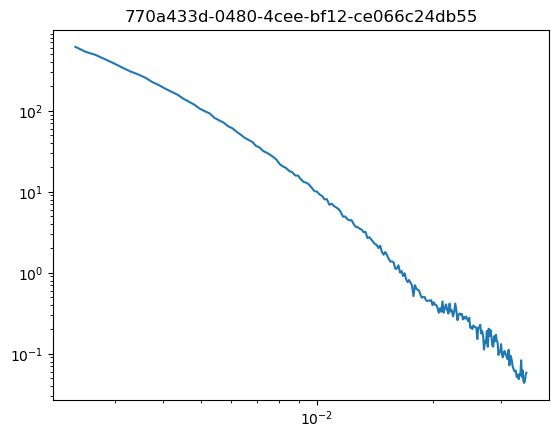

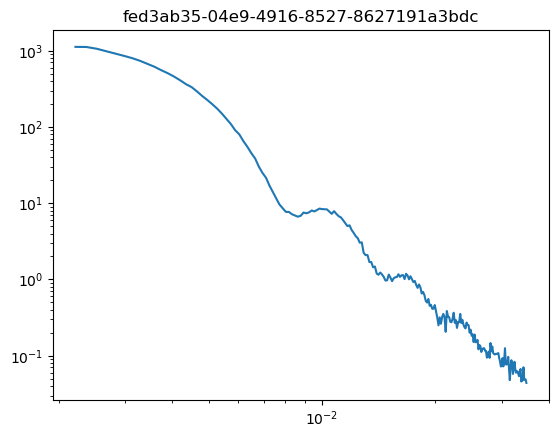

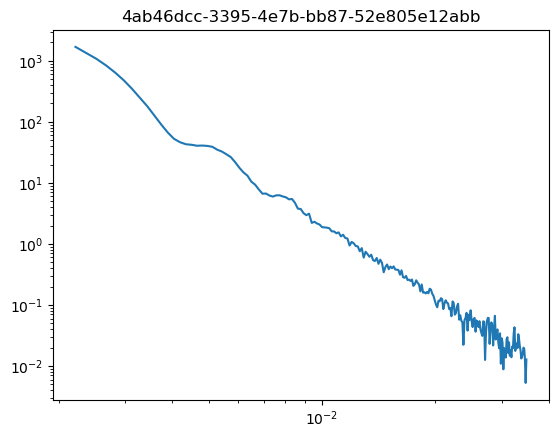

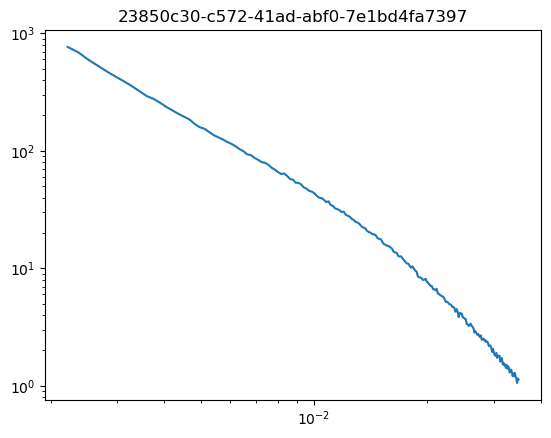

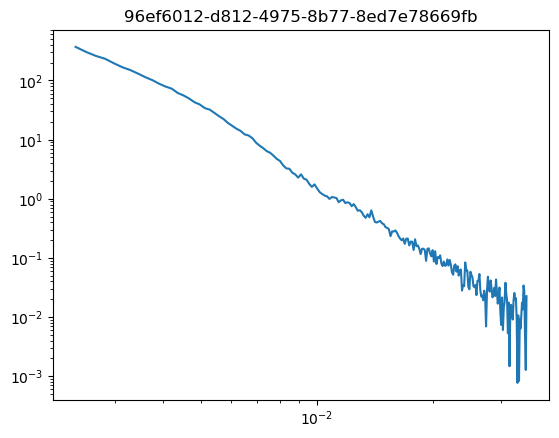

...

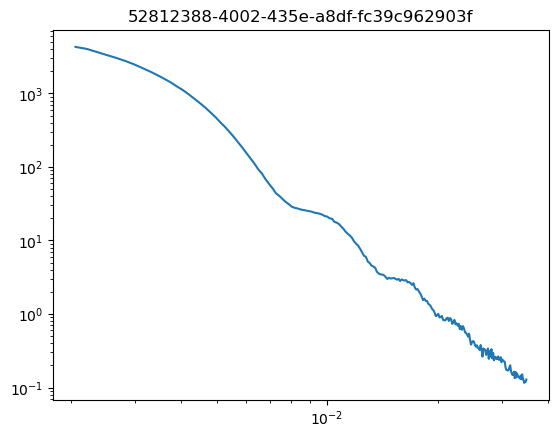

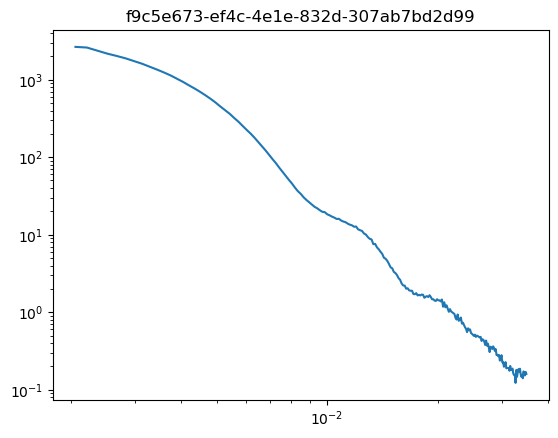

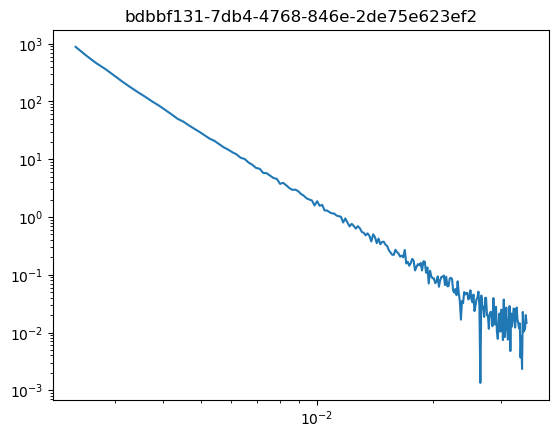

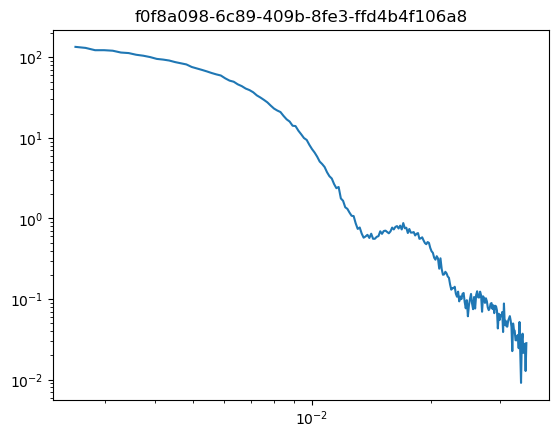

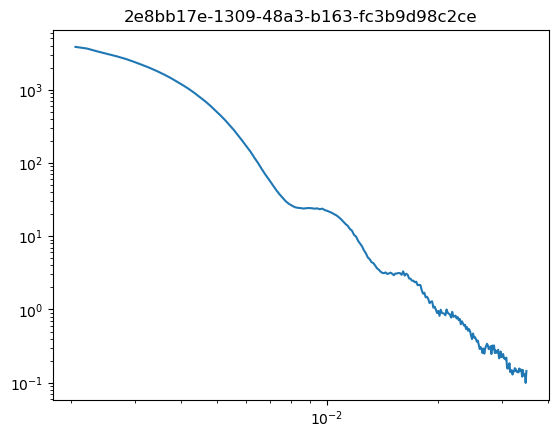

In [17]:
for uuid_val, entry in processing_dataset.items():
    print(uuid_val)
    try:
        status = entry['status']
        if status == 'failed':
            print('failed at ', entry['failure_point'])
            continue
        else:
            raise KeyError
    except KeyError:
        fig, ax = plt.subplots()
    
        I_subtracted = entry['subtracted_clipped']['I']
        q = entry['subtracted_clipped']['q']
    
        ax.loglog(q, I_subtracted)
        ax.set_title(uuid_val)

## Fit sphere model

In [18]:
for uuid_val, entry in processing_dataset.items():
    try:
        subtracted = entry['subtracted_clipped']
    except KeyError:
        continue
        
    data_sas = io.df_to_sasdata(subtracted)
    results, result_obj, problem  = sasview_fitting.fit_sphere(data_sas, polydispersity=True)

    processing_dataset[uuid_val]['sphere_fit_results'] = results
    processing_dataset[uuid_val]['sphere_fit_problem'] = problem

In [19]:
diameters = {}
pdi_vals = {}

for uuid_val, entry in processing_dataset.items():
    try:
        sphere_results = entry['sphere_fit_results']
        d = sphere_results['radius']*2/10
        pdi = sphere_results['radius_pd']
        diameters[uuid_val] = d
        pdi_vals[uuid_val] = pdi
    except KeyError:
        continue

In [20]:
diameters_dist = {uuid_val:np.abs(d-120) for uuid_val, d in diameters.items()}

In [21]:
min_dist = np.min(list(diameters_dist.values()))
min_uuid_d = [val for val in diameters_dist.keys() if diameters_dist[val] == min_dist][0]

In [22]:
min_uuid_d

'89b8593e-8436-4dfb-8430-1367d273cbc2'

In [23]:
diameters_dist[min_uuid_d]

1.1852616538001683

In [24]:
min_pdi = np.sort(list(pdi_vals.values()))[1]
min_uuid_pdi = [val for val in pdi_vals.keys() if pdi_vals[val] == min_pdi][0]

In [25]:
min_uuid_pdi

'1a084599-bbe6-4de7-89ef-9791617c5e9f'

In [26]:
min_pdi

0.07804970838385421

## sanity check fit results

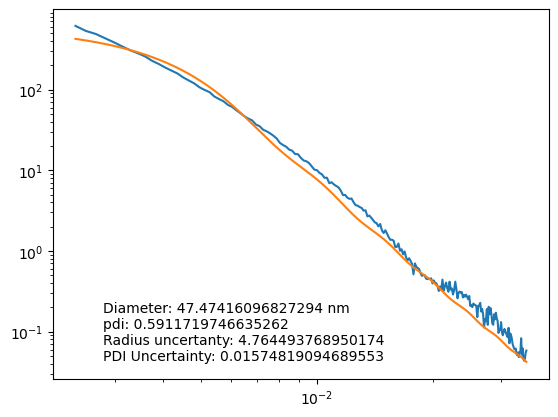

reasonable fit? y


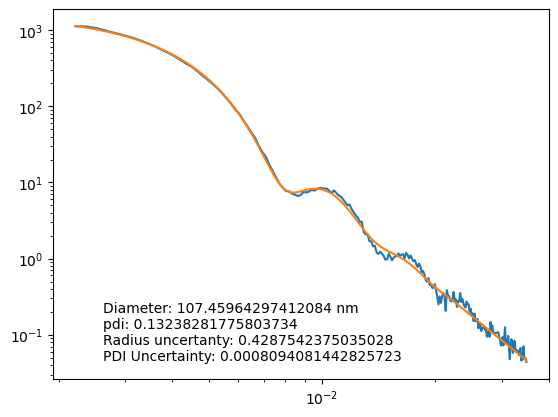

reasonable fit? y


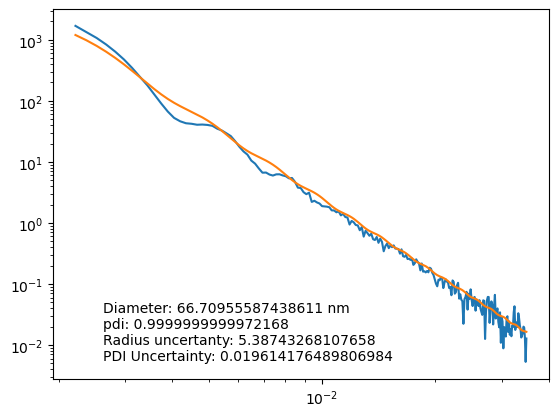

reasonable fit? n


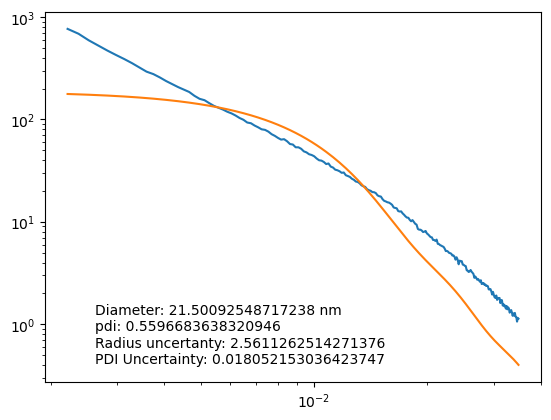

reasonable fit? n


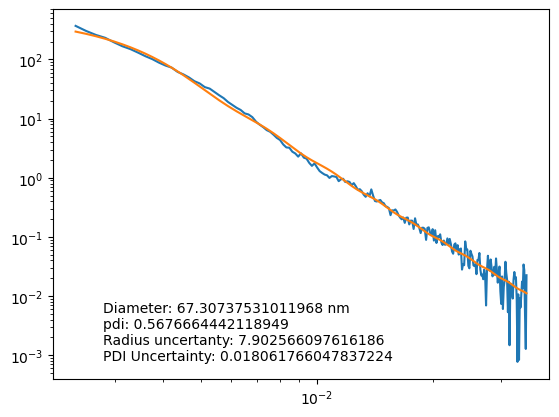

reasonable fit? y


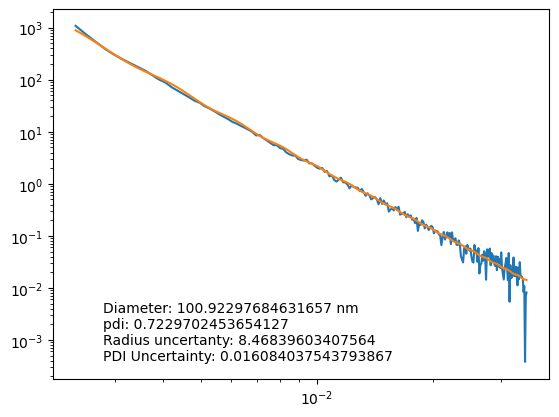

reasonable fit? y


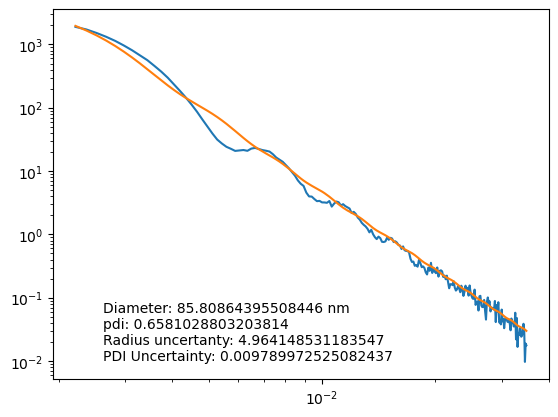

reasonable fit? n


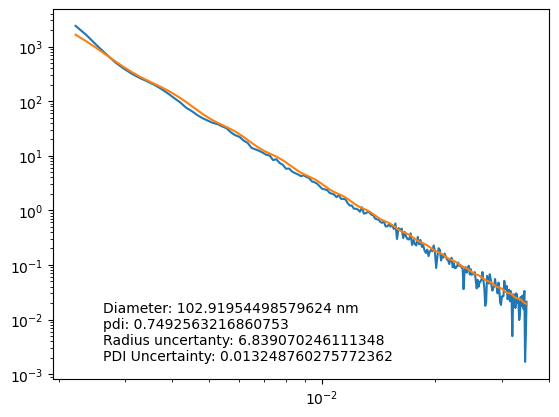

reasonable fit? y


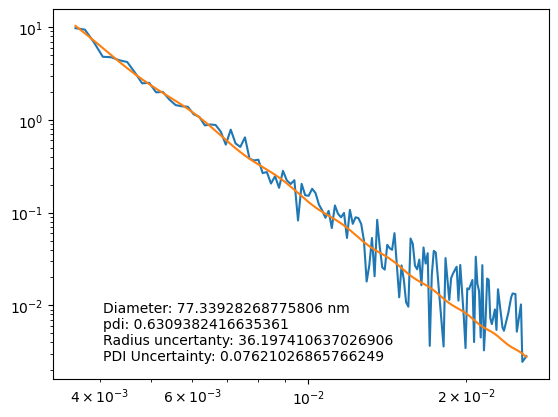

reasonable fit? y


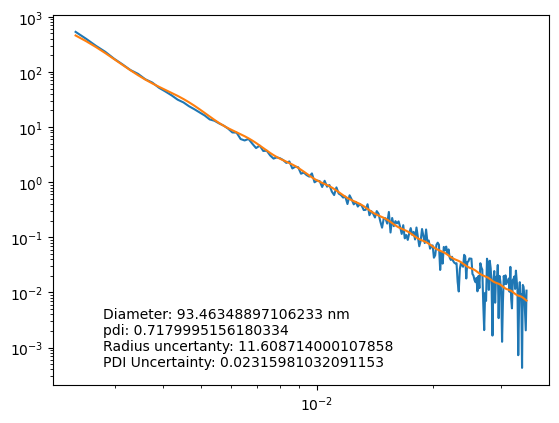

reasonable fit? y


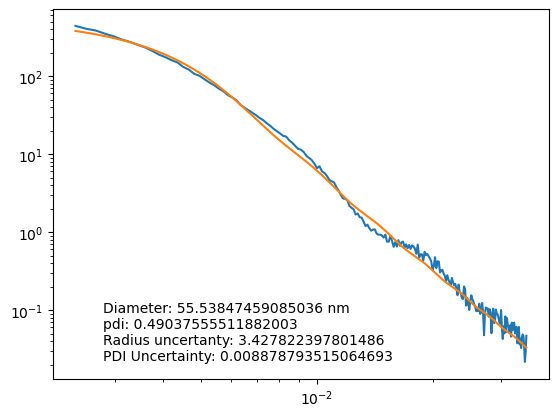

reasonable fit? y


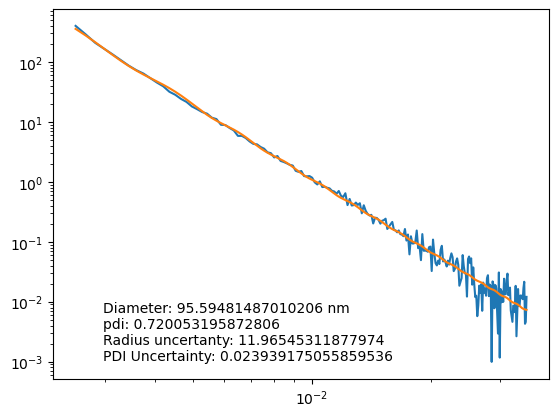

reasonable fit? y


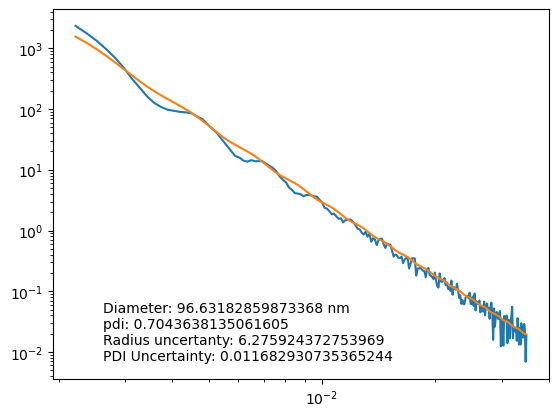

reasonable fit? n


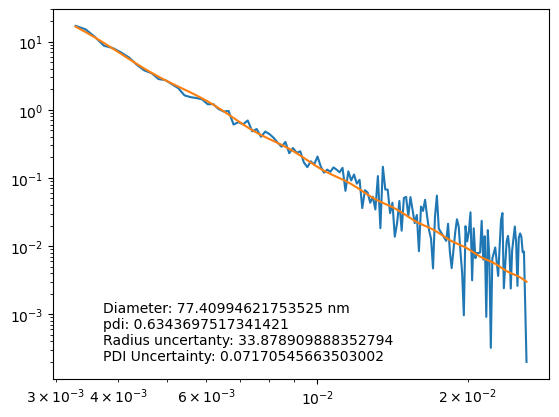

reasonable fit? y


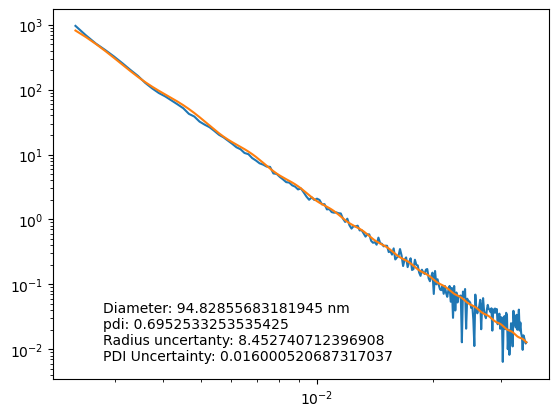

reasonable fit? y


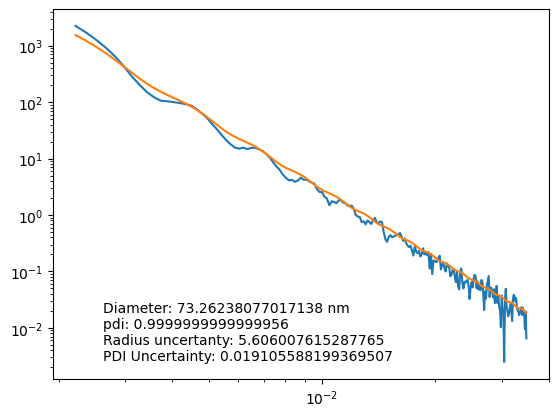

reasonable fit? n


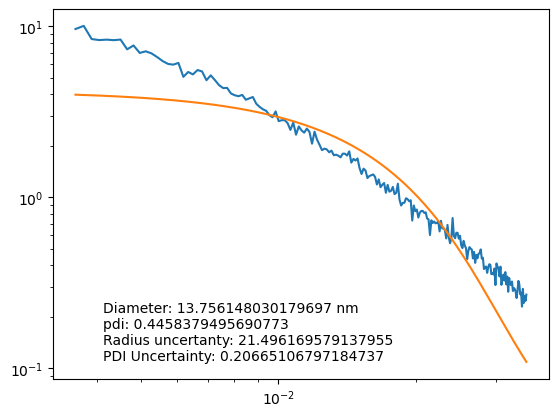

reasonable fit? n


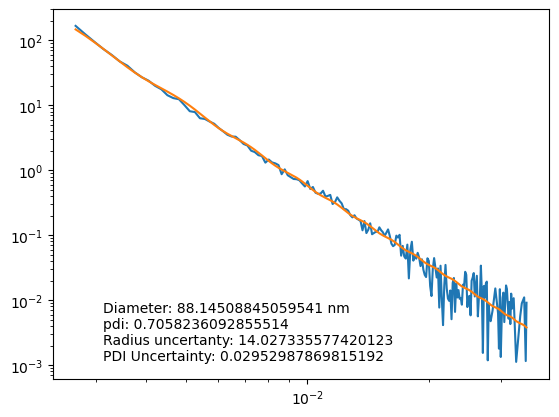

reasonable fit? y


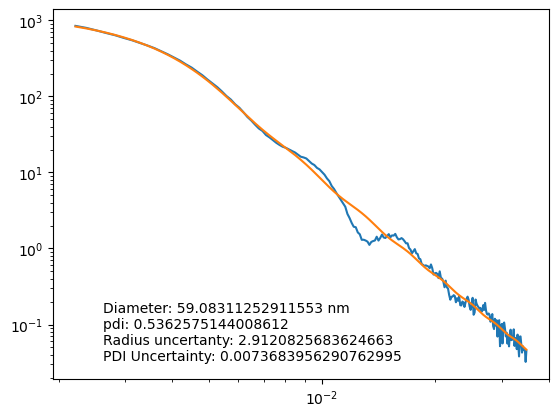

reasonable fit? n


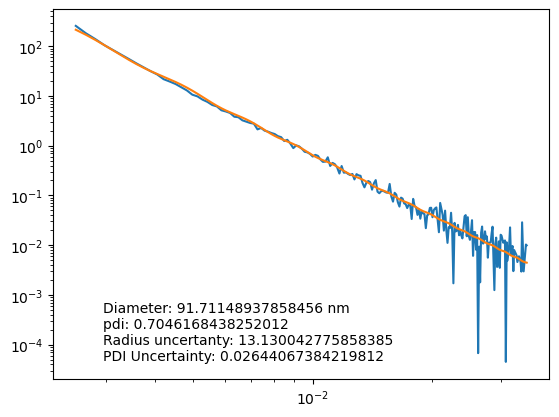

reasonable fit? y


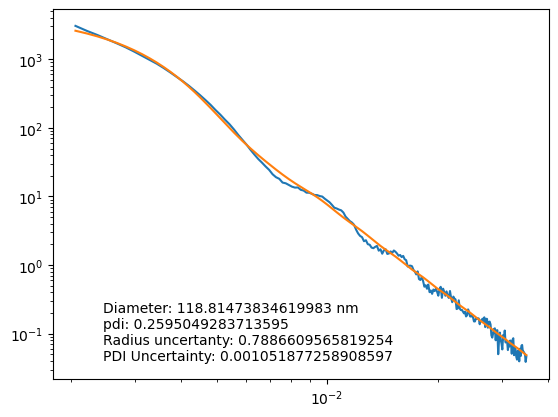

reasonable fit? y


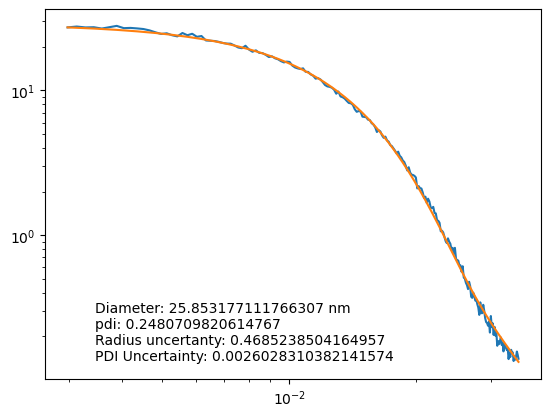

reasonable fit? y


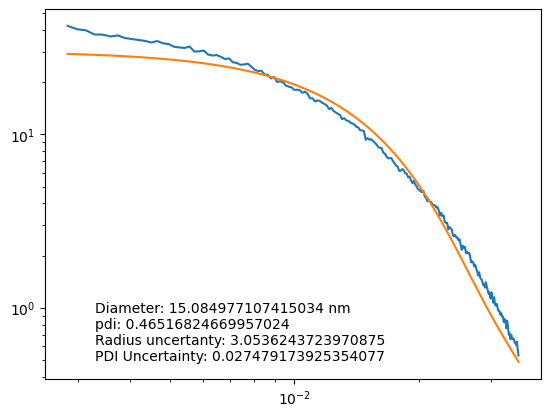

reasonable fit? y


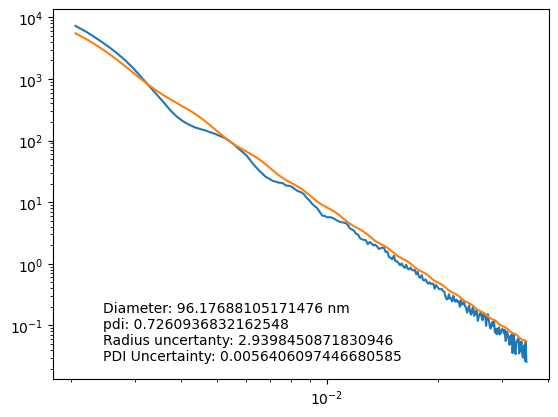

reasonable fit? n


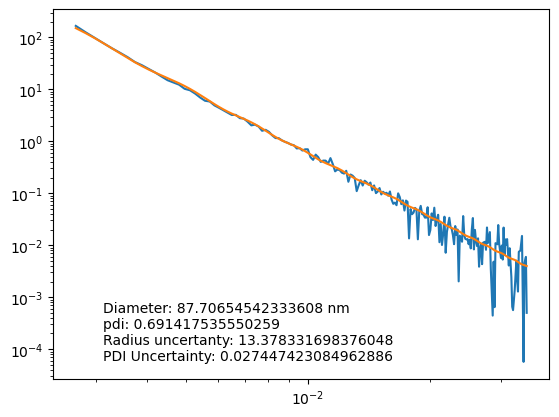

reasonable fit? y


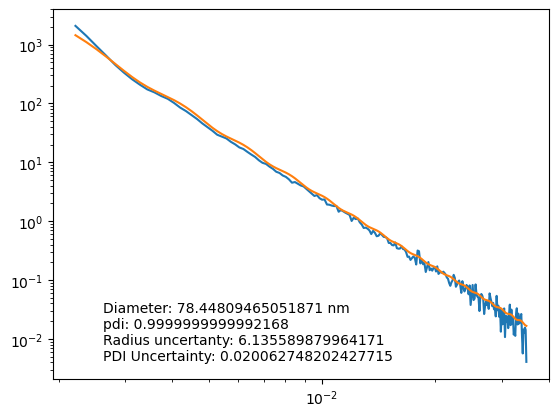

reasonable fit? y


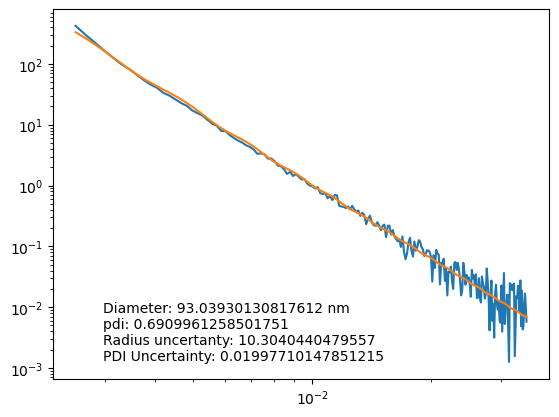

reasonable fit? y


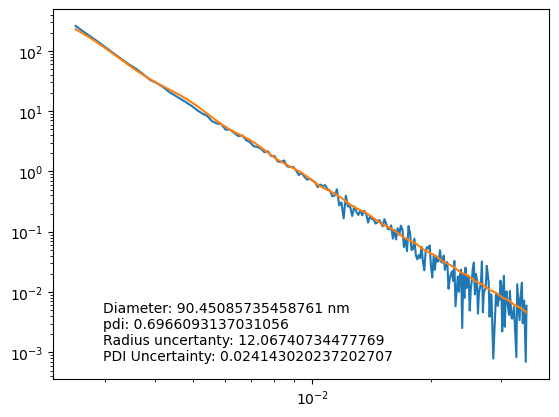

reasonable fit? y


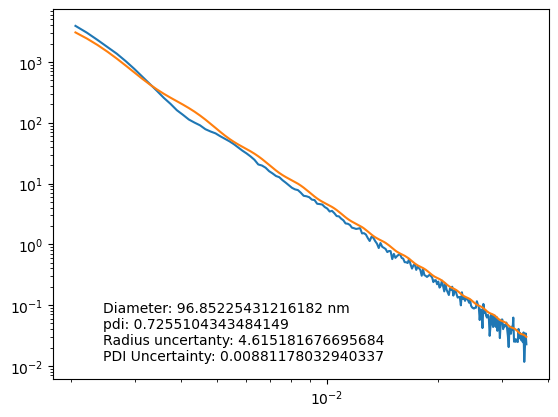

reasonable fit? y


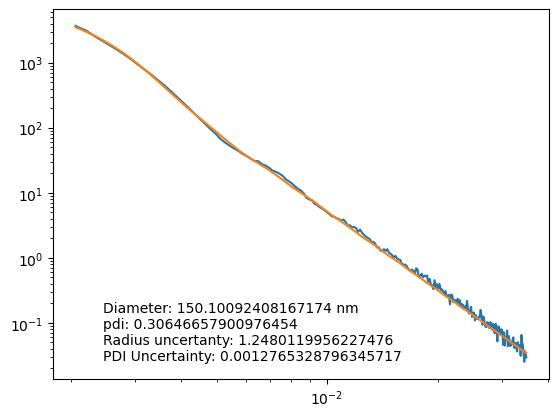

reasonable fit? y


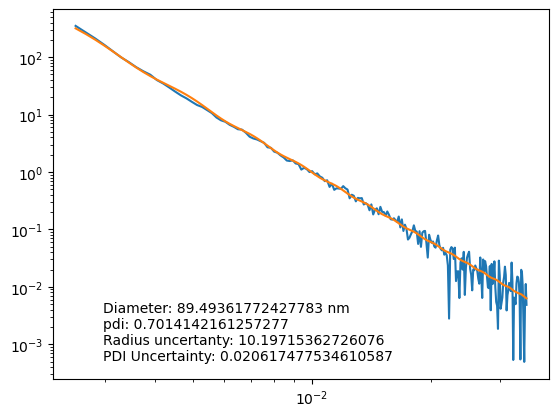

reasonable fit? y


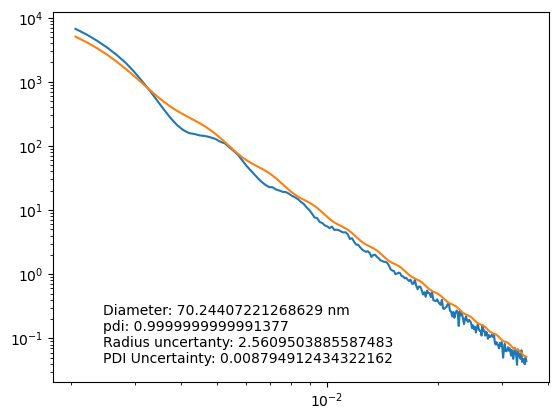

reasonable fit? n


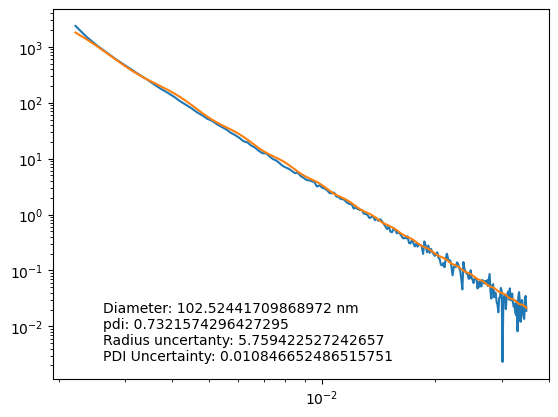

reasonable fit? y


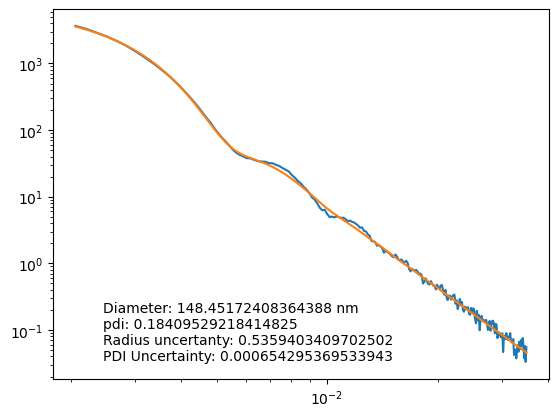

reasonable fit? y


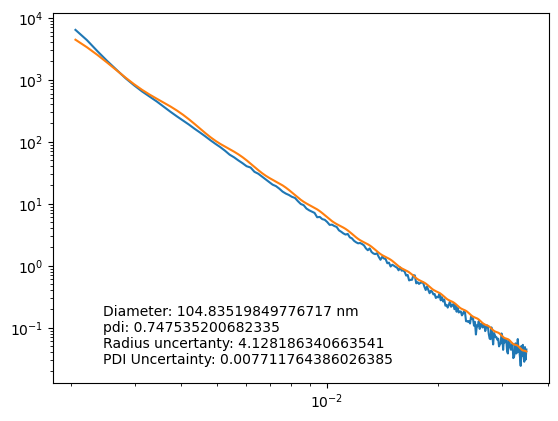

reasonable fit? y


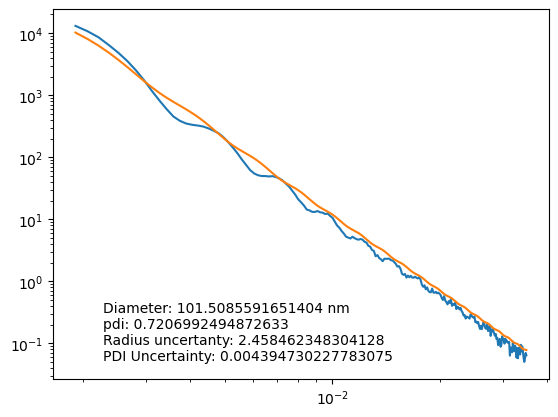

reasonable fit? n


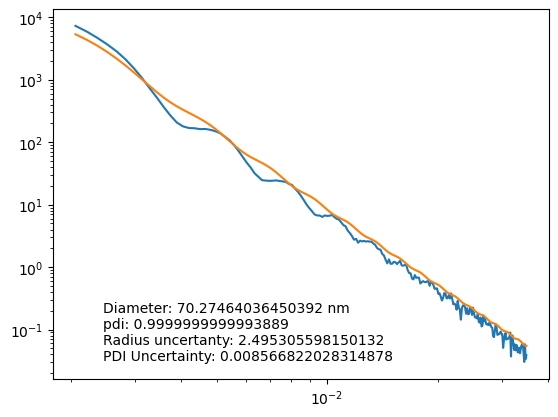

reasonable fit? n


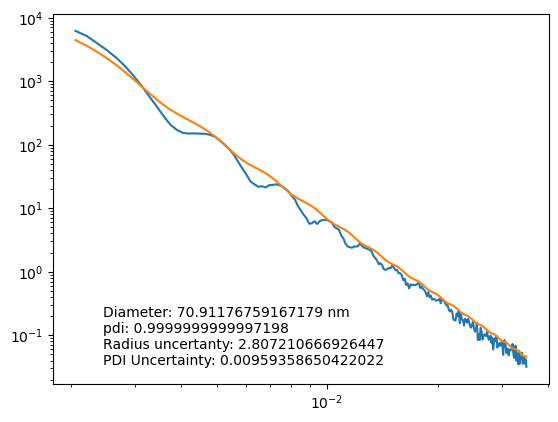

reasonable fit? n


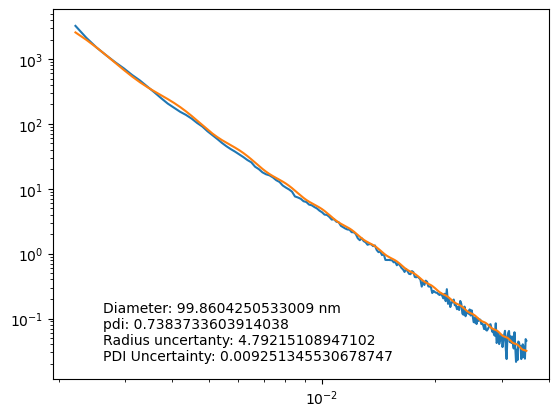

reasonable fit? y


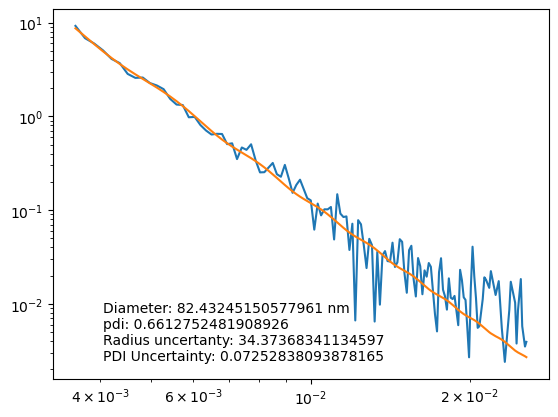

reasonable fit? y


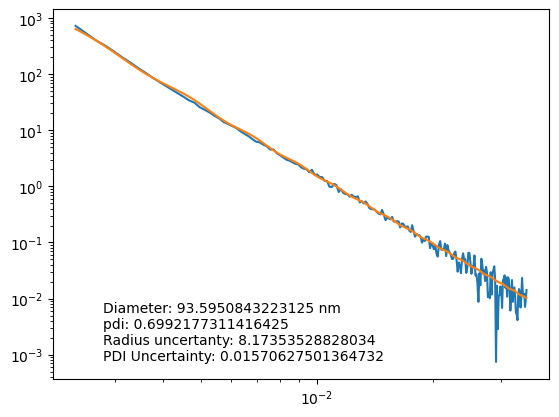

reasonable fit? y


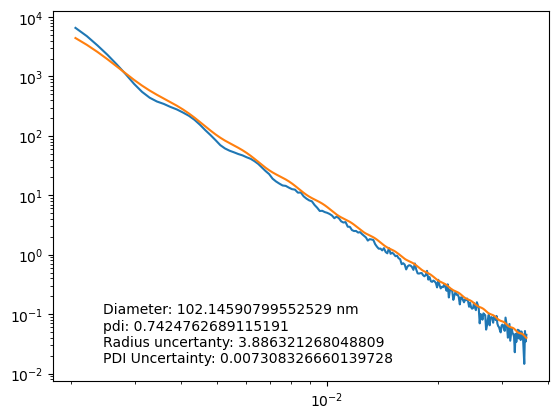

reasonable fit? n


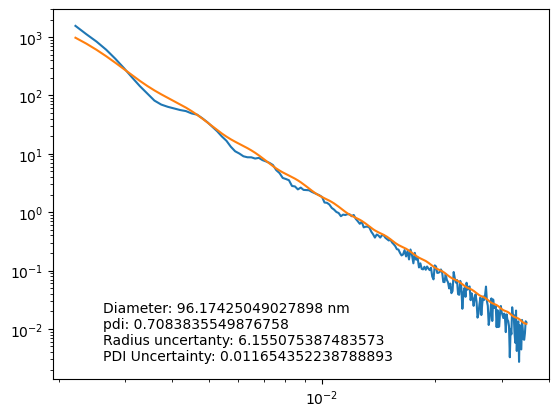

reasonable fit? n


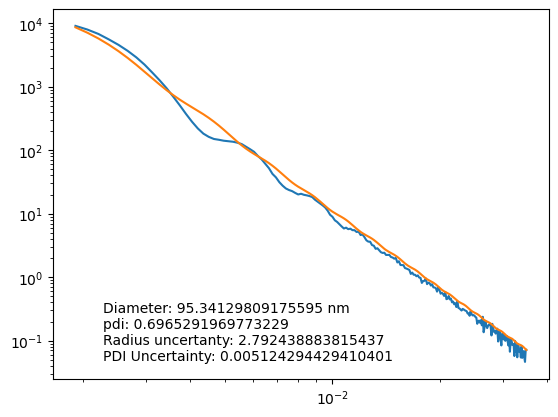

reasonable fit? n


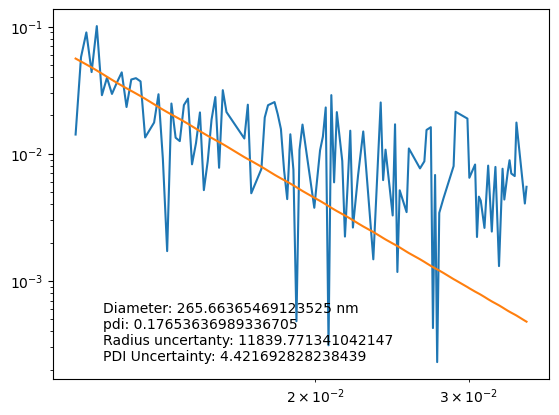

reasonable fit? n


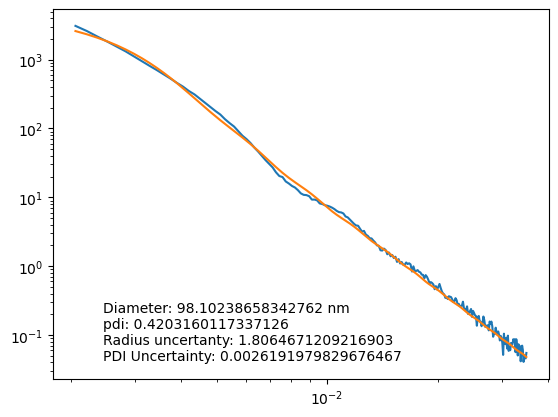

reasonable fit? y


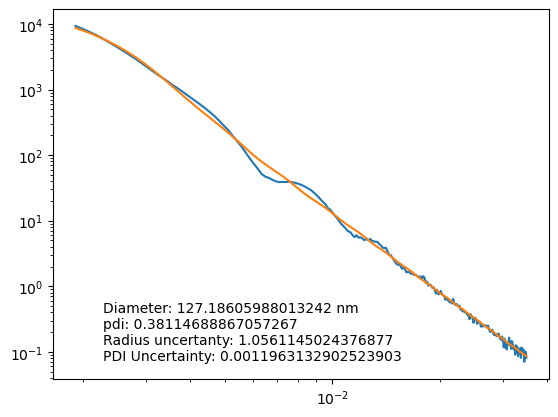

reasonable fit? y


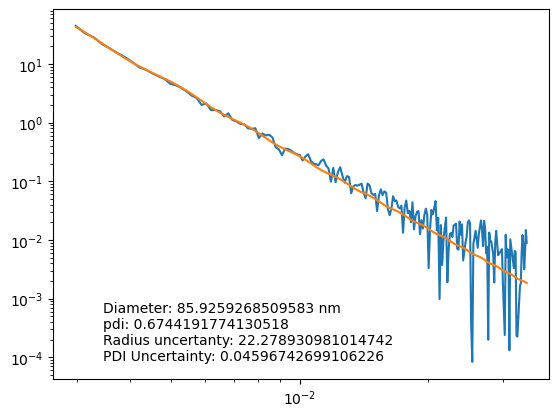

reasonable fit? y


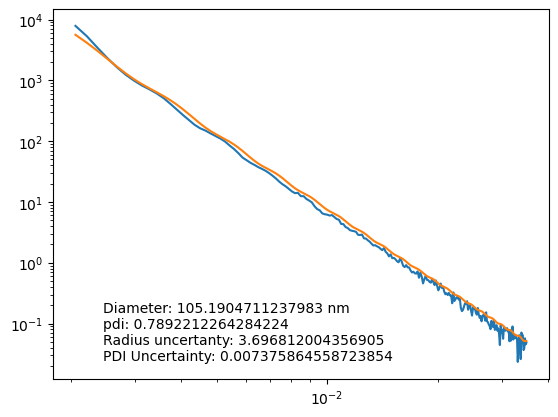

reasonable fit? y


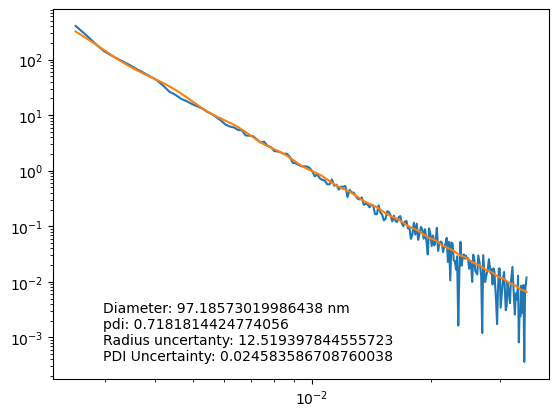

reasonable fit? y


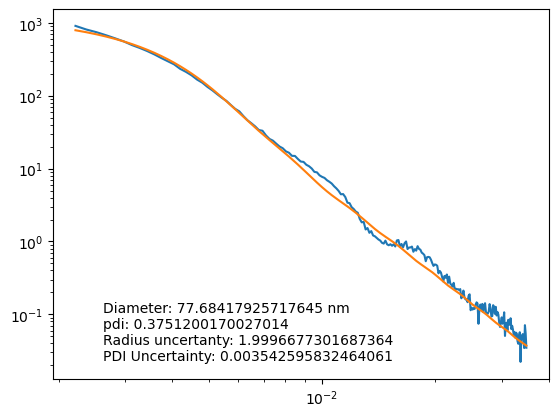

reasonable fit? y


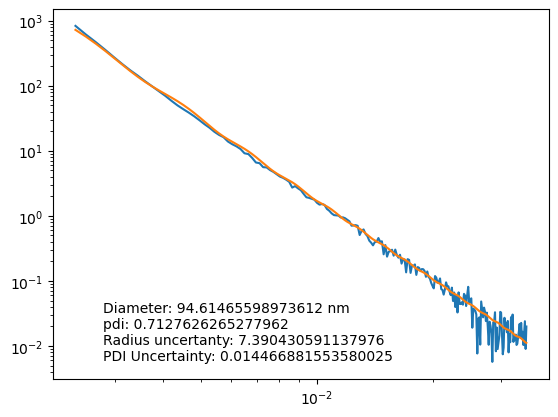

reasonable fit? y


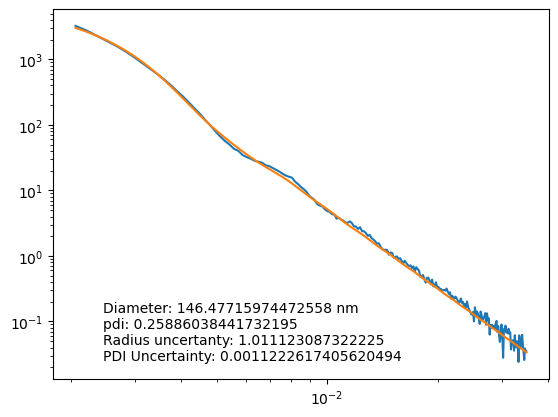

reasonable fit? y


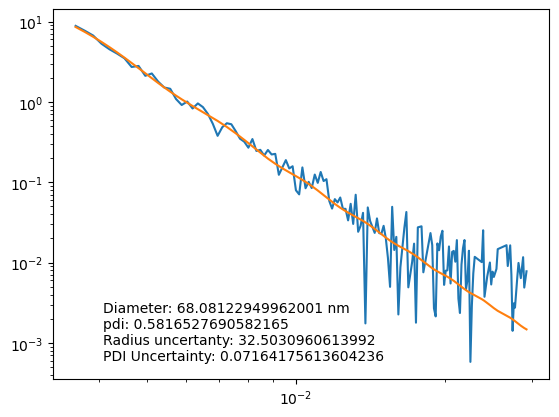

reasonable fit? y


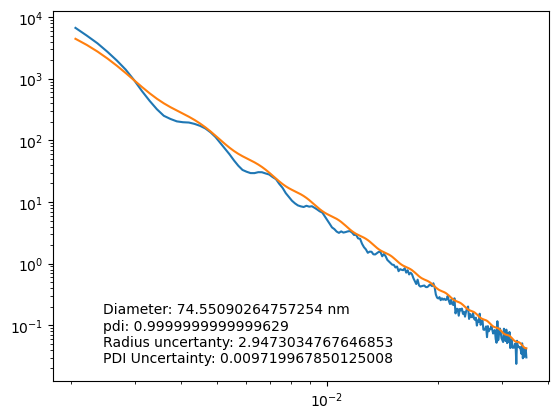

reasonable fit? n


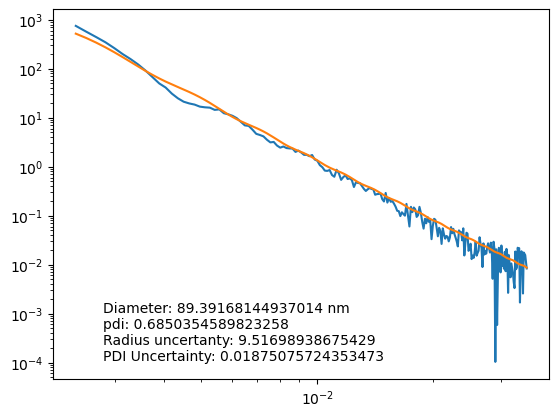

reasonable fit? y


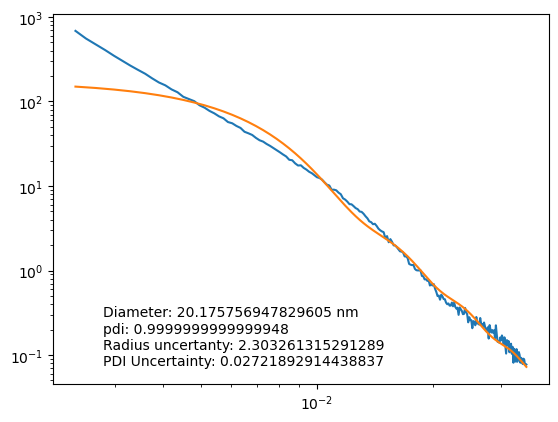

reasonable fit? n


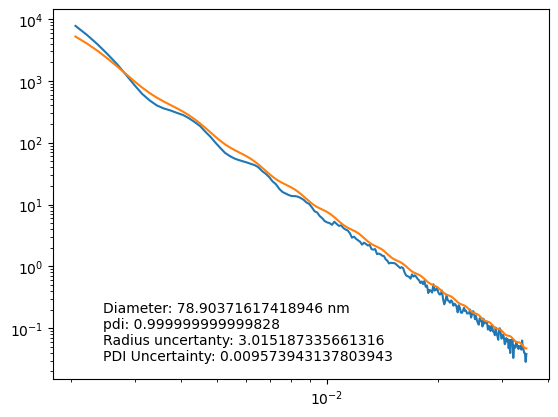

reasonable fit? y


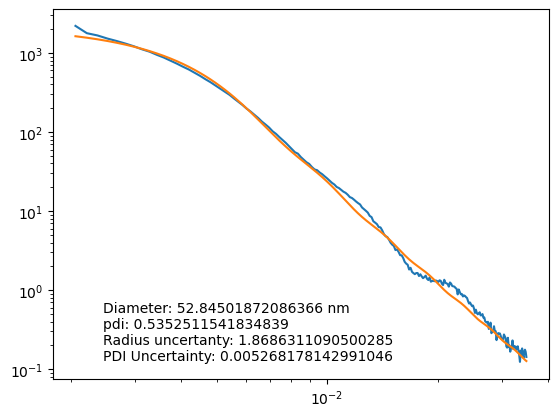

reasonable fit? y


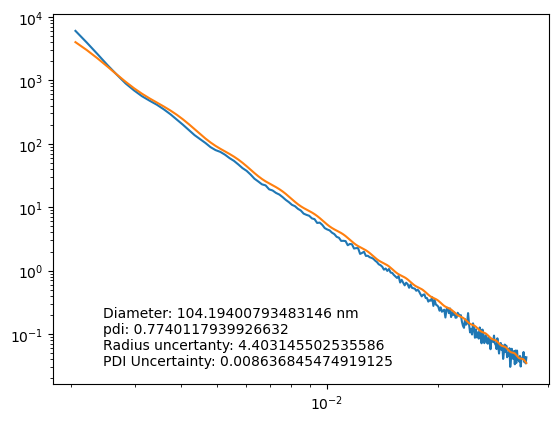

reasonable fit? y


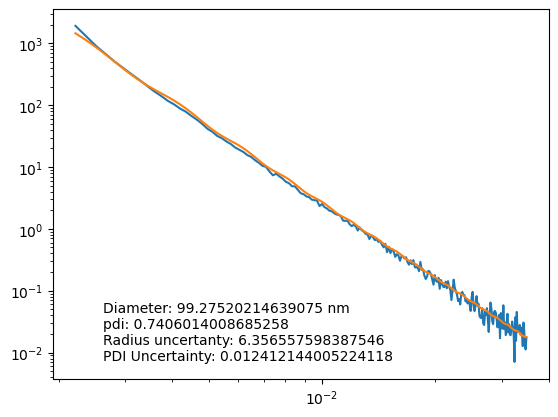

reasonable fit? y


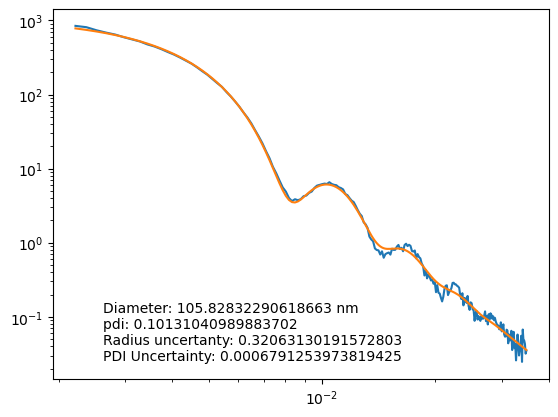

reasonable fit? y


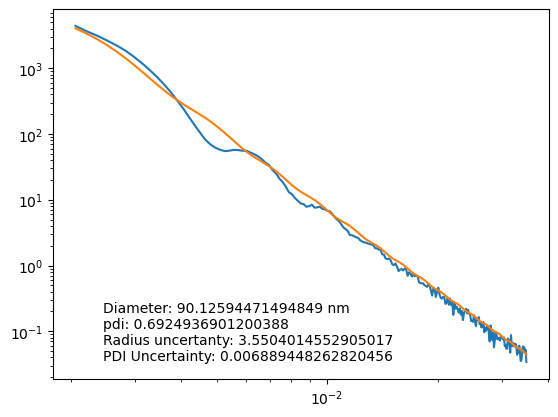

reasonable fit? n


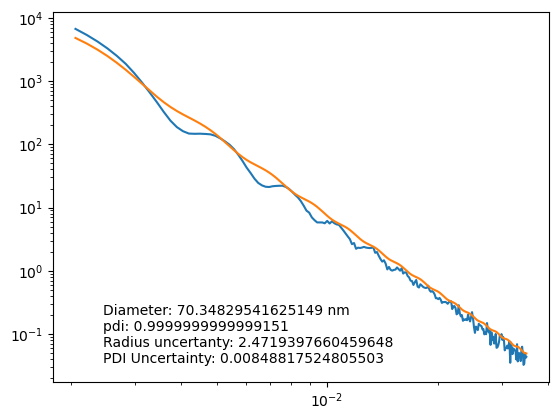

reasonable fit? n


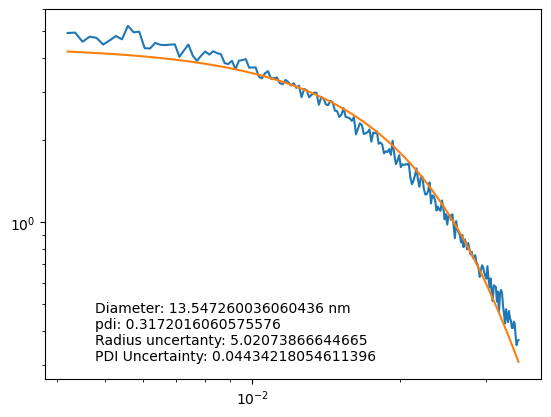

reasonable fit? y


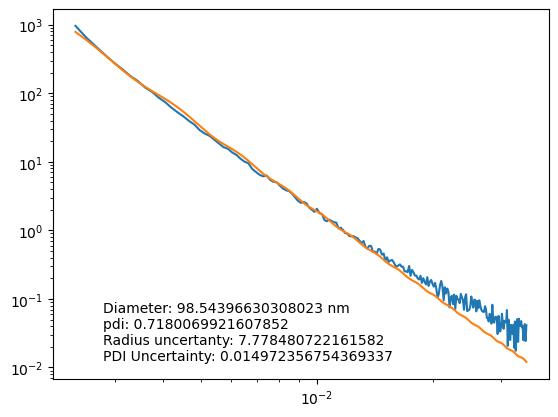

reasonable fit? y


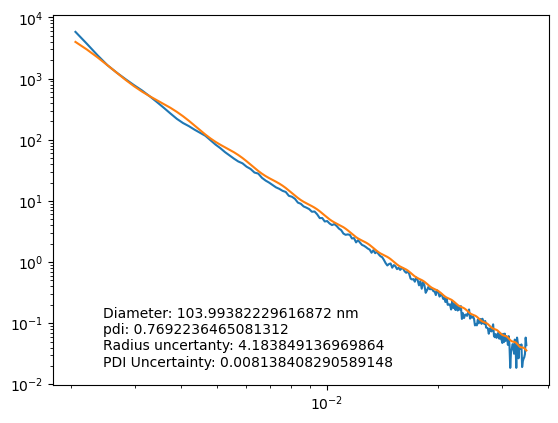

reasonable fit? y


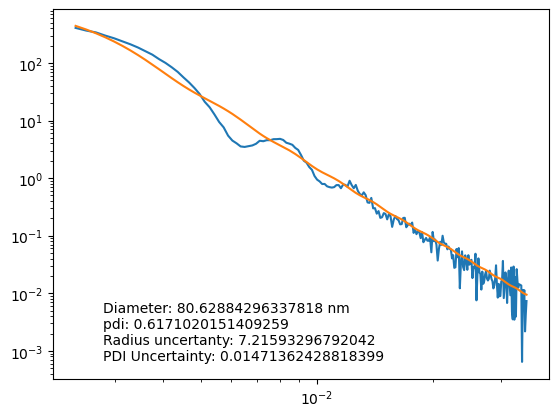

reasonable fit? n


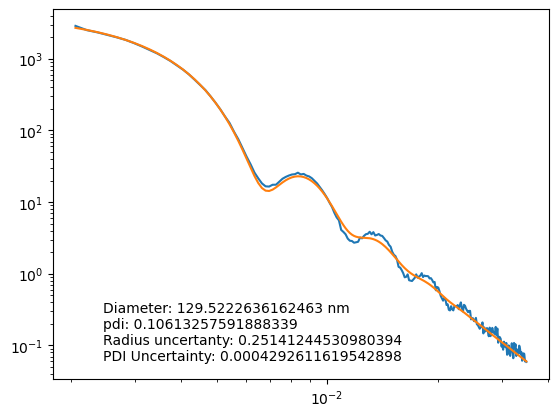

reasonable fit? y


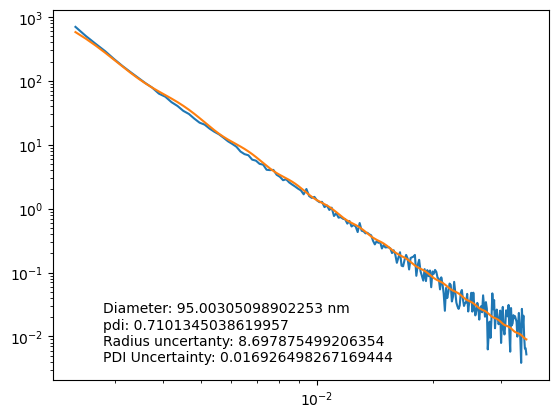

reasonable fit? y


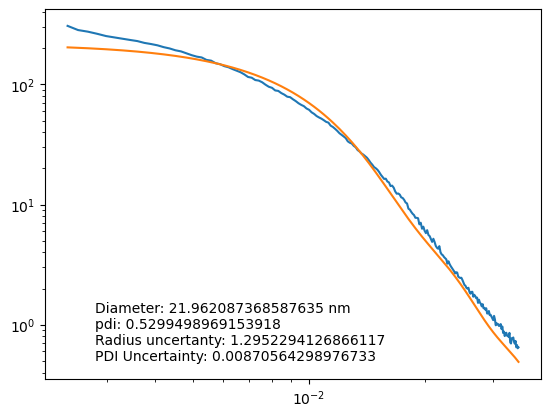

reasonable fit? y


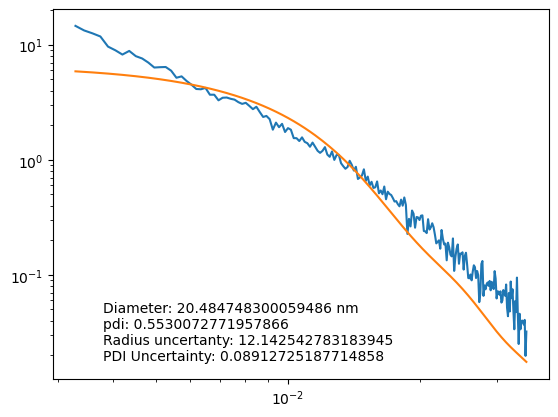

reasonable fit? n


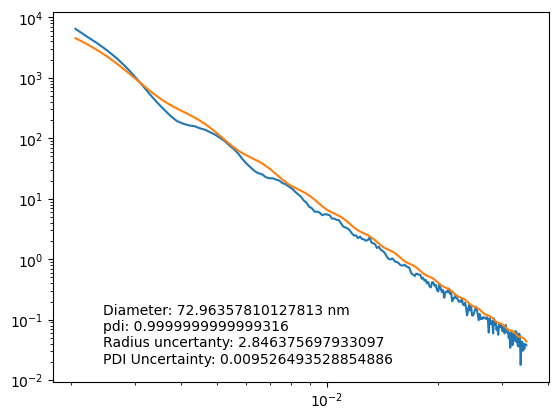

reasonable fit? n


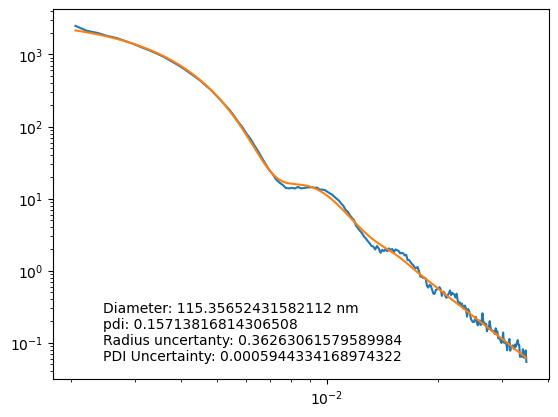

reasonable fit? y


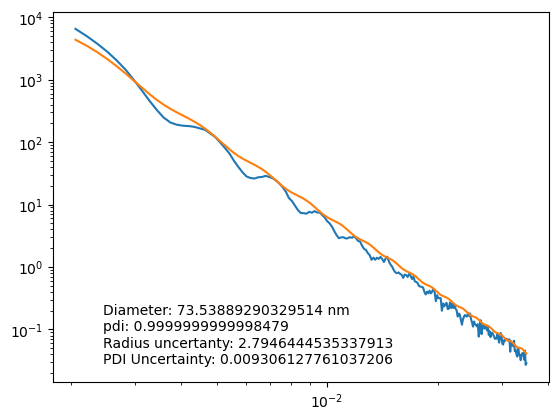

reasonable fit? n


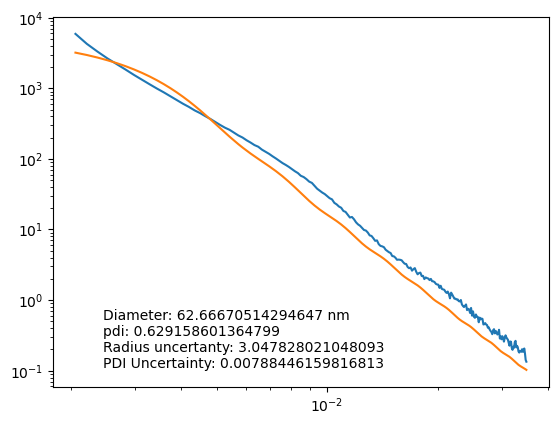

reasonable fit? n


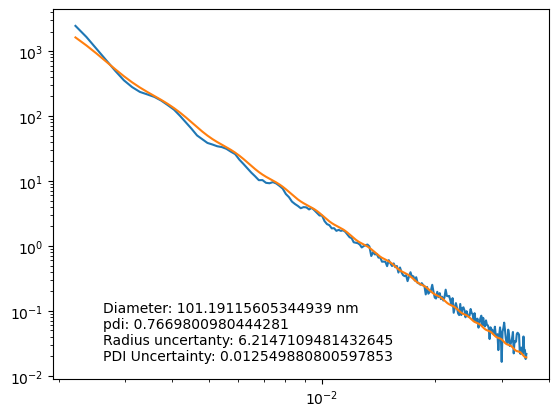

reasonable fit? y


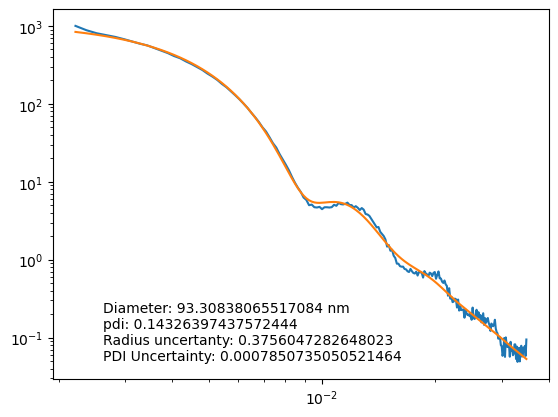

reasonable fit? y


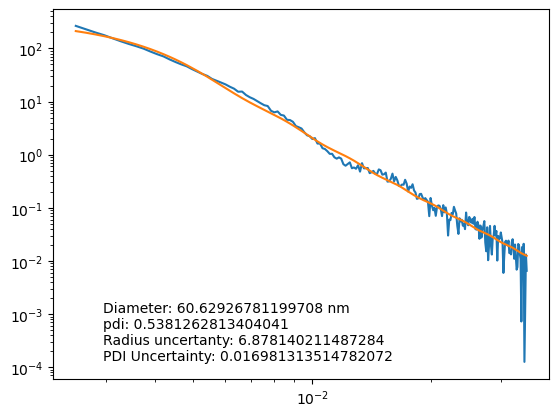

reasonable fit? y


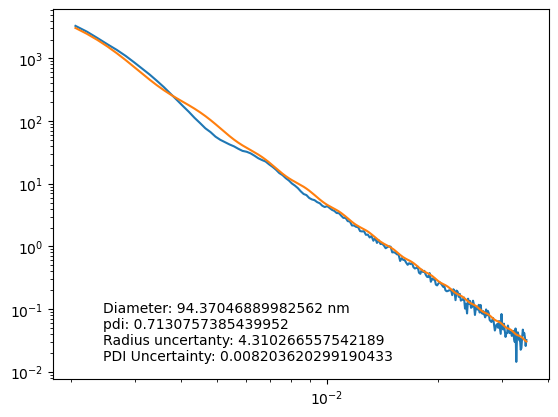

reasonable fit? y


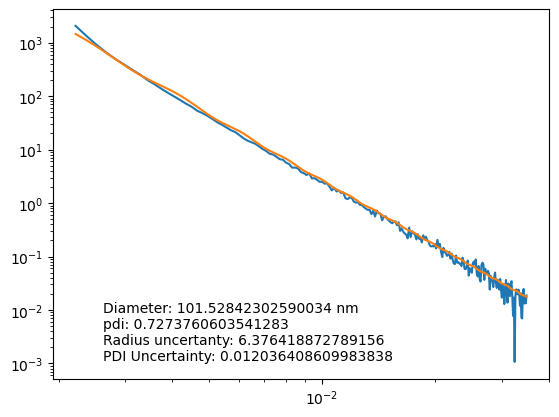

reasonable fit? y


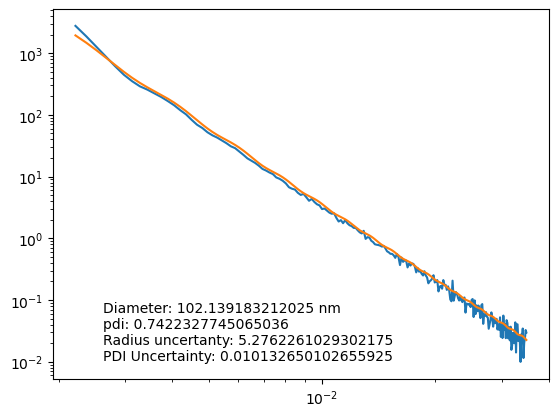

reasonable fit? y


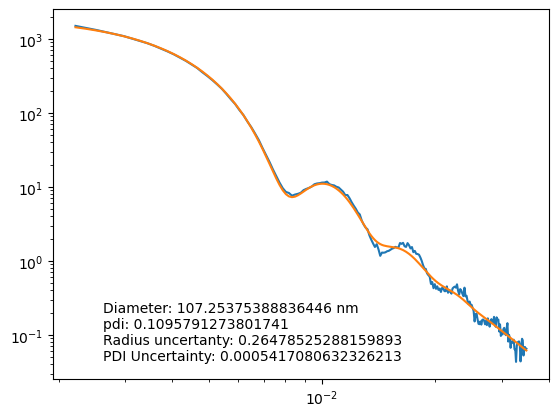

reasonable fit? y


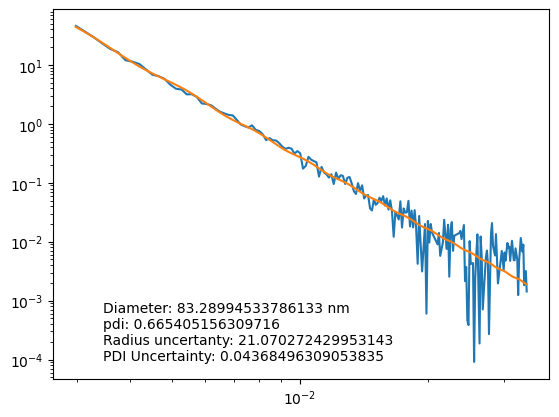

reasonable fit? y


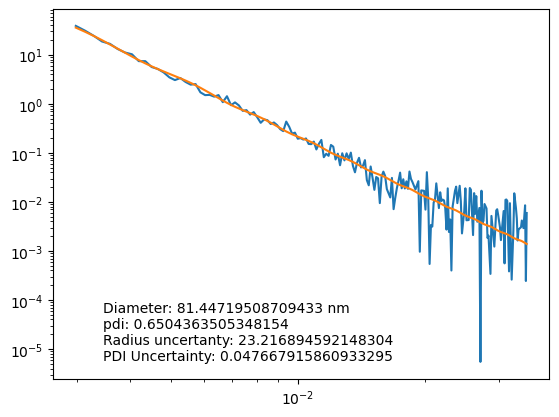

reasonable fit? y


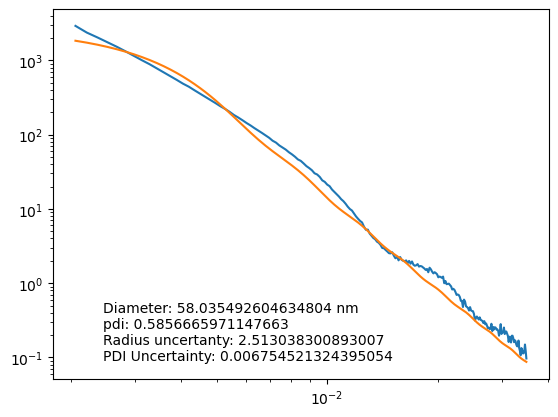

reasonable fit? y


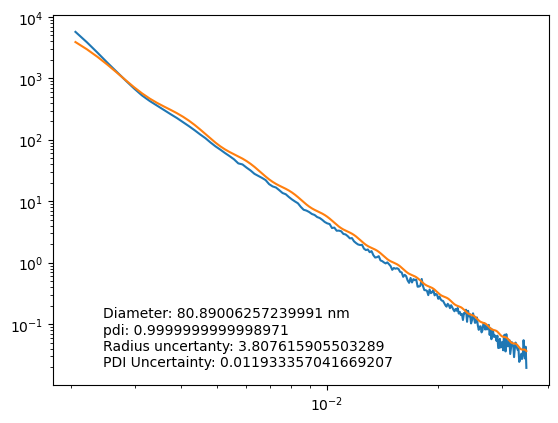

reasonable fit? y


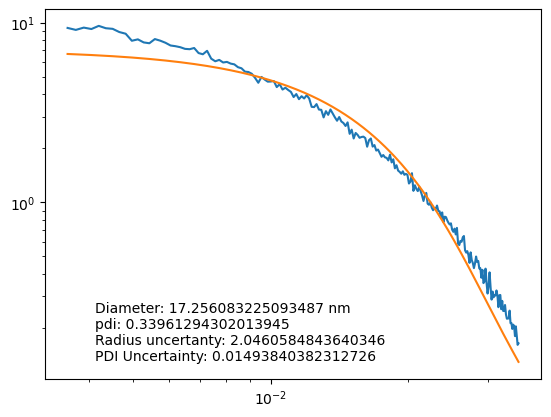

reasonable fit? y


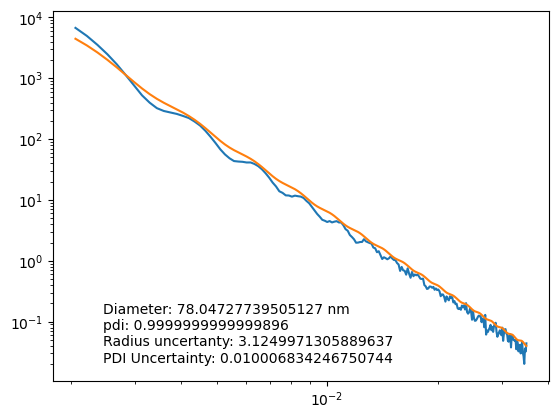

reasonable fit? y


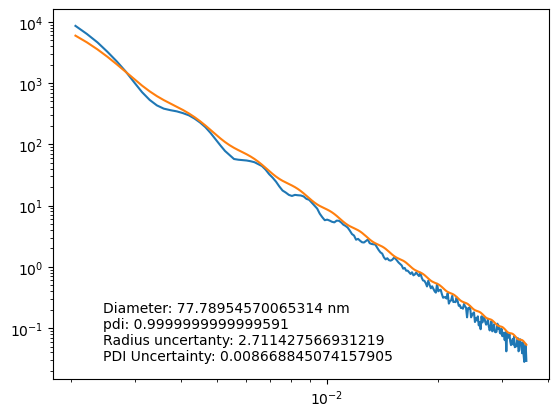

reasonable fit? y


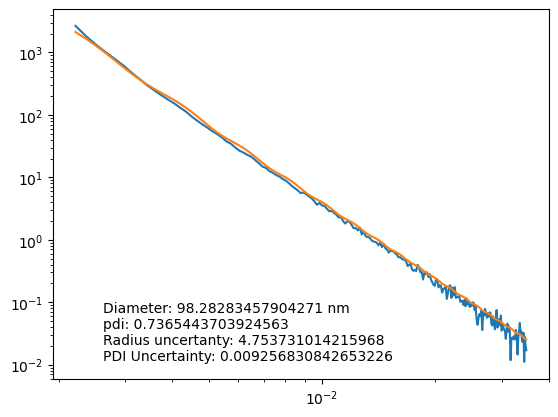

reasonable fit? y


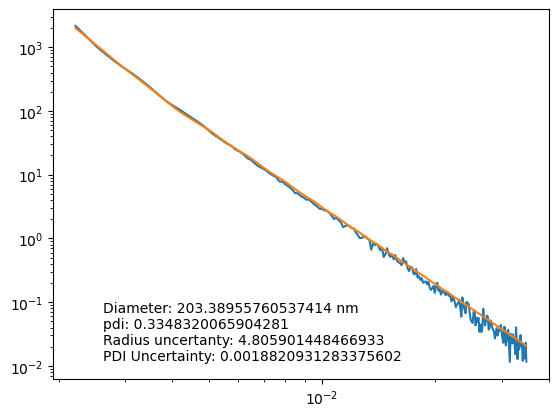

reasonable fit? y


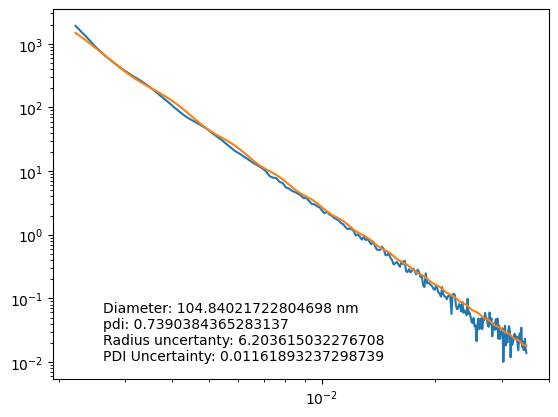

reasonable fit? y


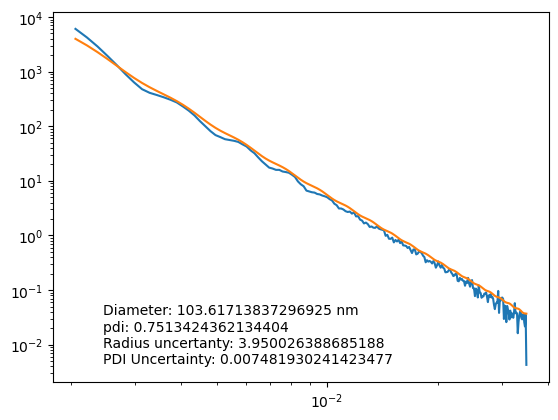

reasonable fit? y


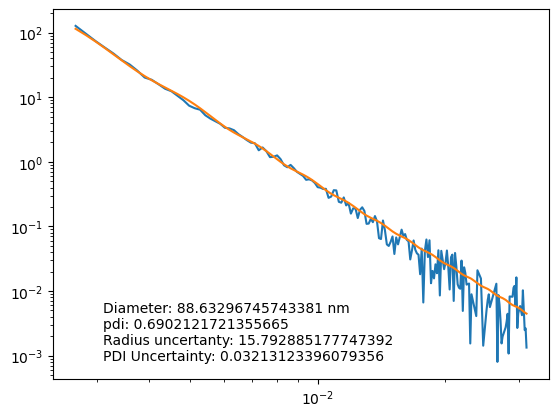

reasonable fit? y


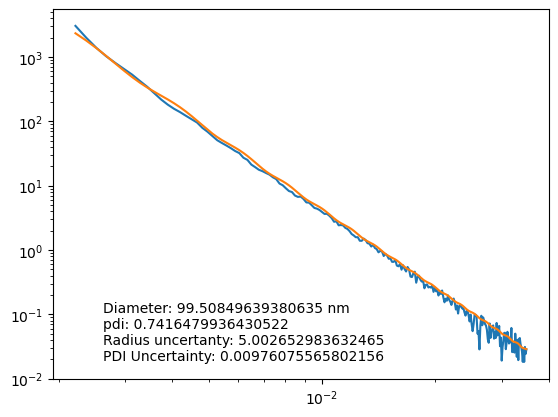

reasonable fit? y


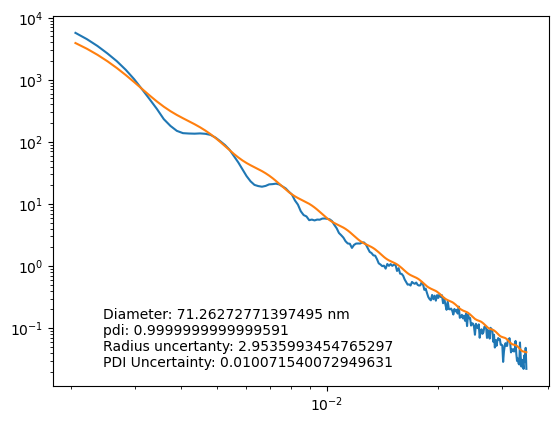

reasonable fit? n


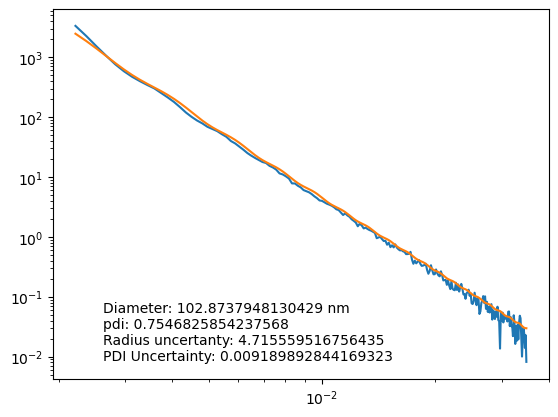

reasonable fit? y


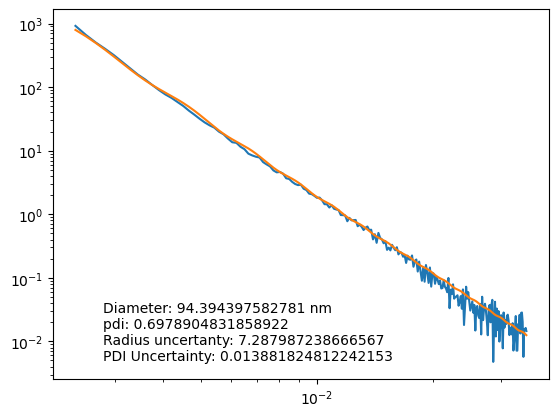

reasonable fit? y


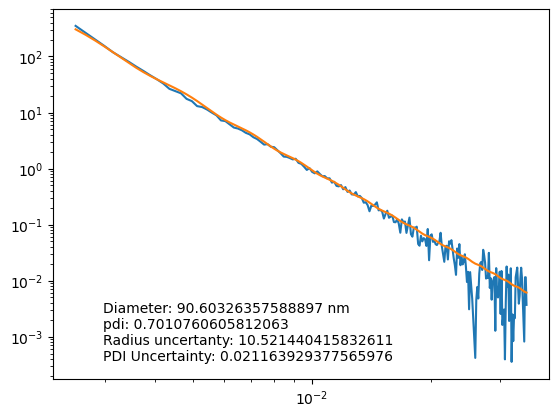

reasonable fit? y


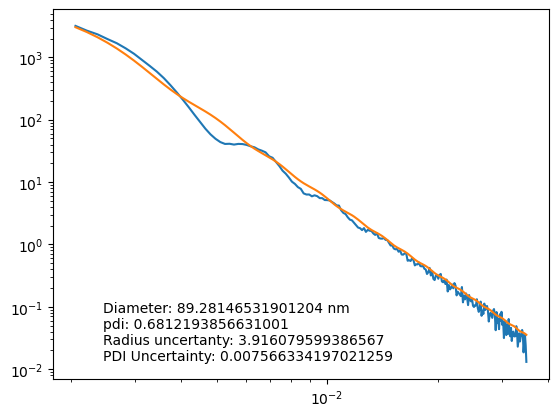

reasonable fit? y


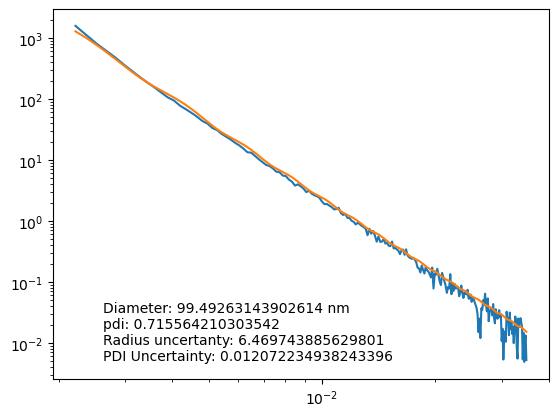

reasonable fit? y


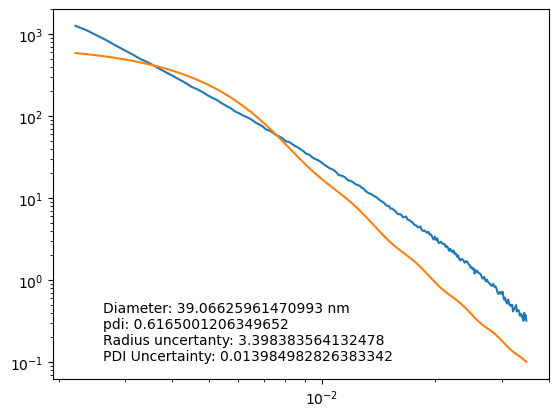

reasonable fit? n


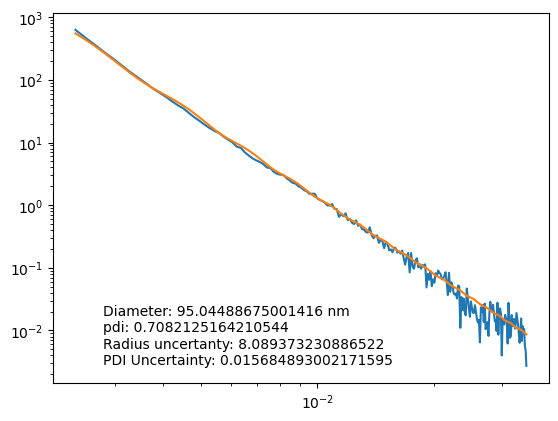

reasonable fit? y


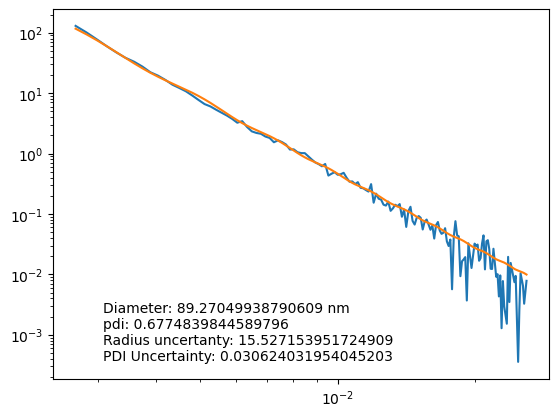

reasonable fit? y


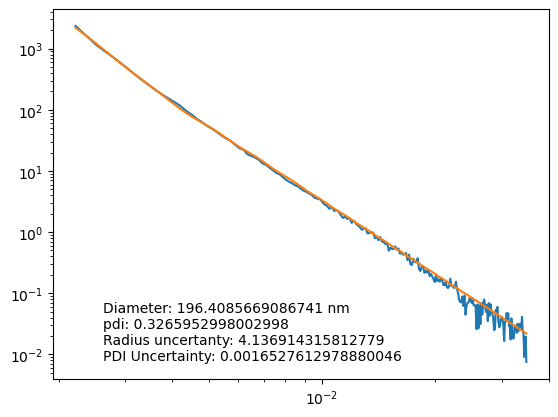

reasonable fit? y


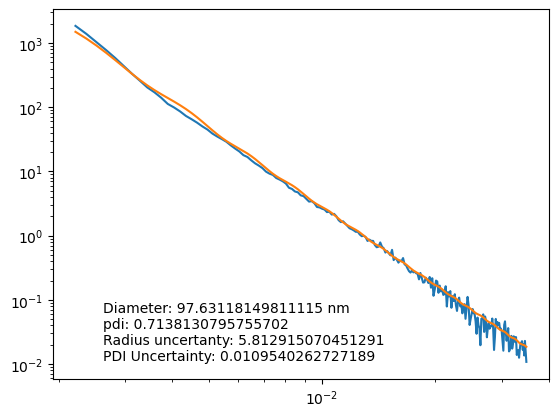

reasonable fit? y


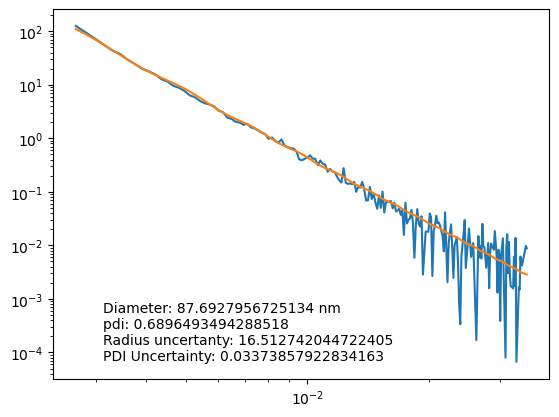

reasonable fit? y


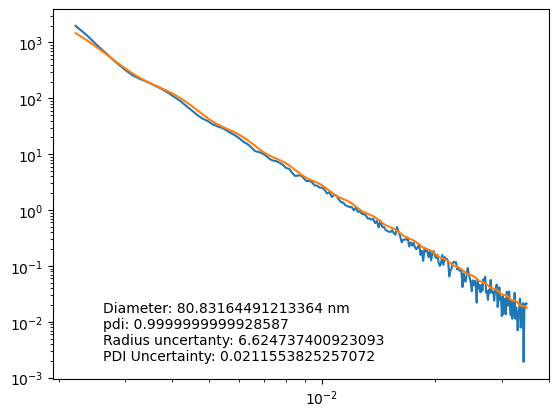

reasonable fit? y


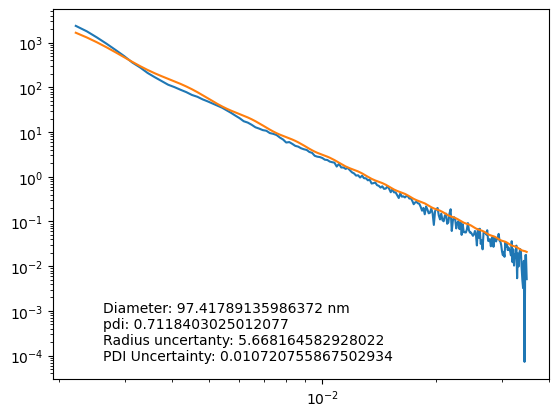

reasonable fit? y


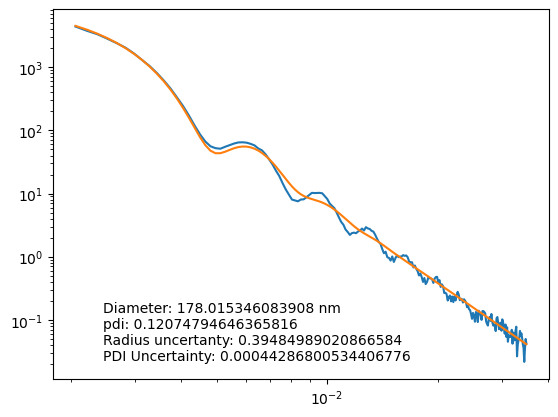

reasonable fit? y


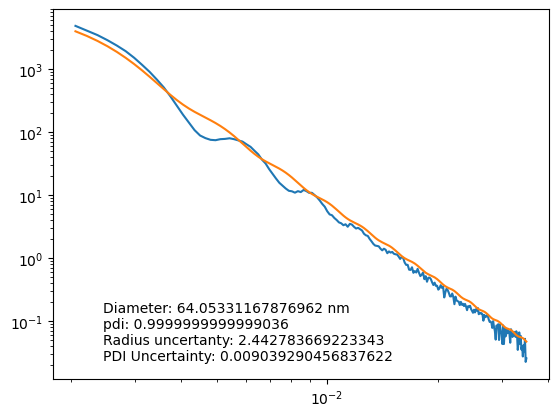

reasonable fit? n


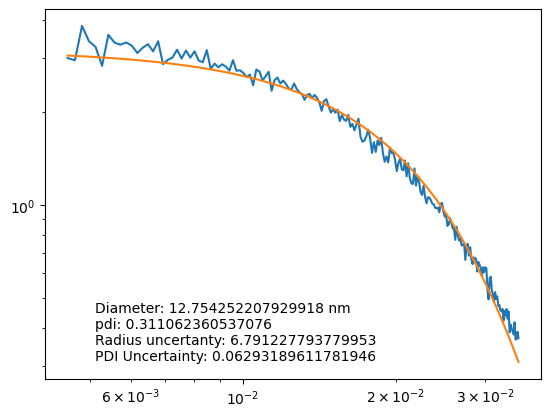

reasonable fit? y


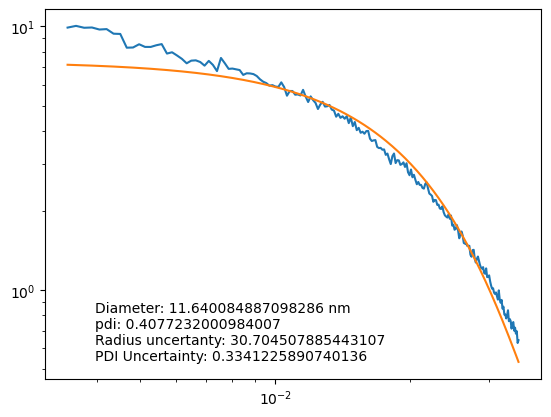

reasonable fit? y


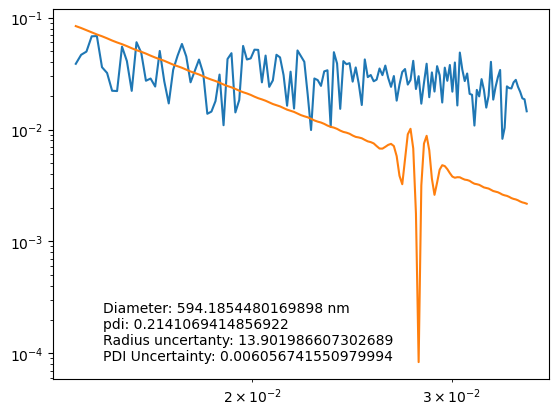

reasonable fit? n


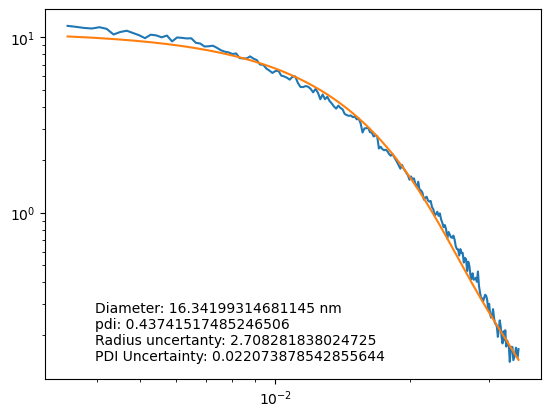

reasonable fit? y


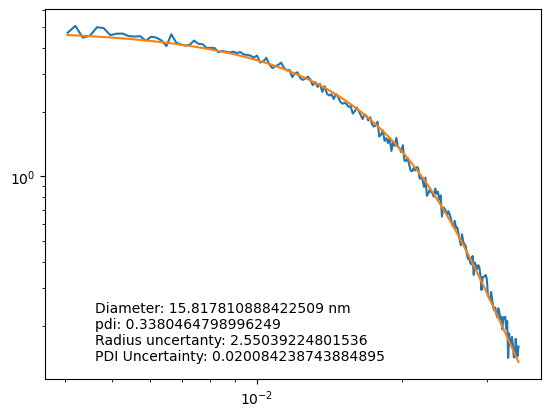

reasonable fit? y


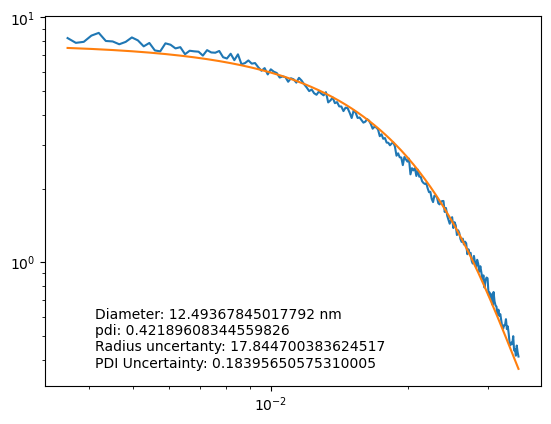

reasonable fit? y


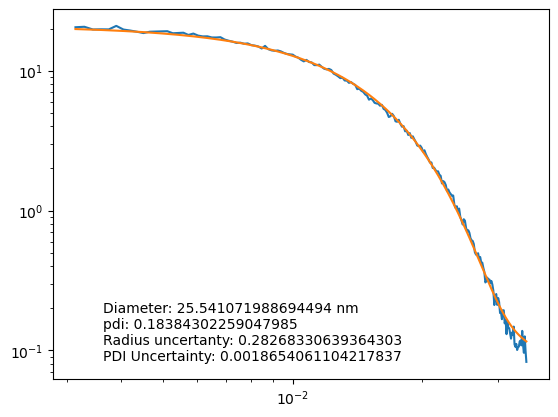

reasonable fit? y


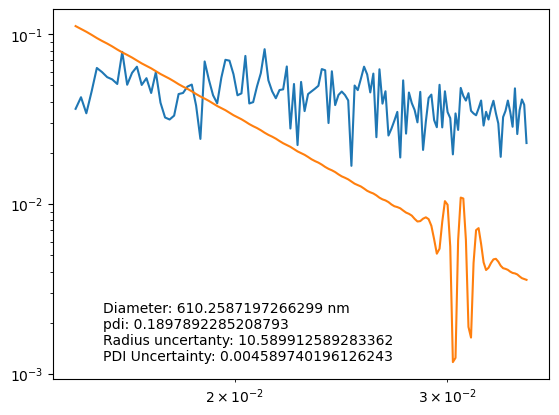

reasonable fit? n


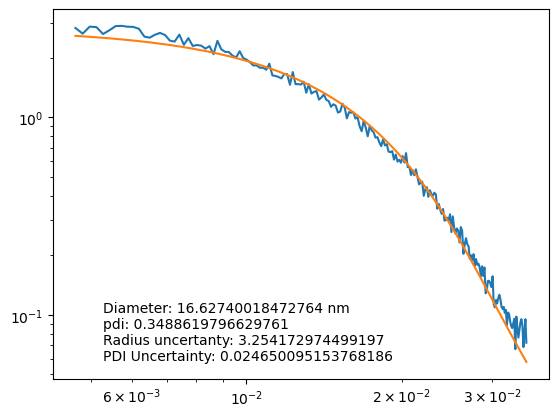

reasonable fit? y


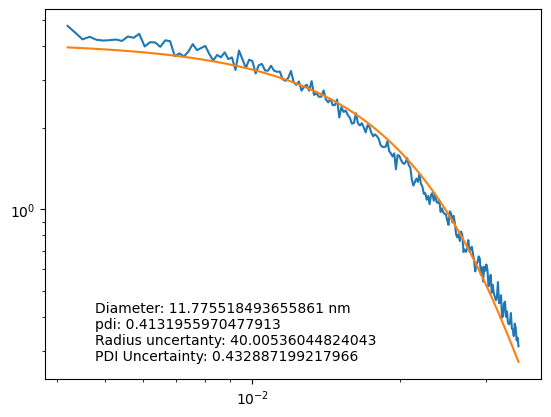

reasonable fit? y


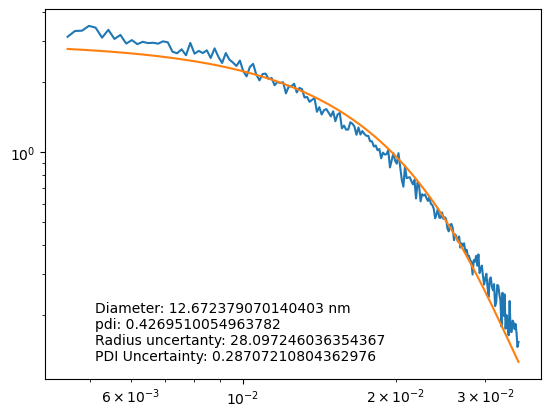

reasonable fit? y


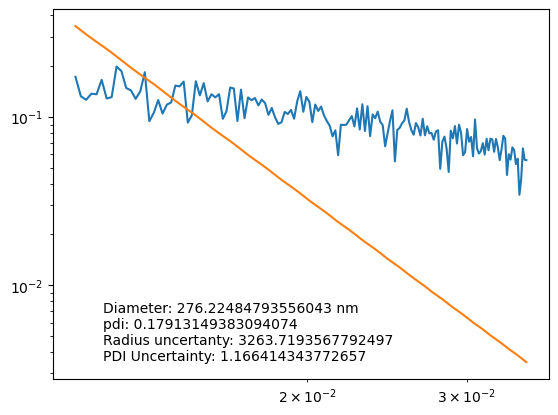

reasonable fit? n


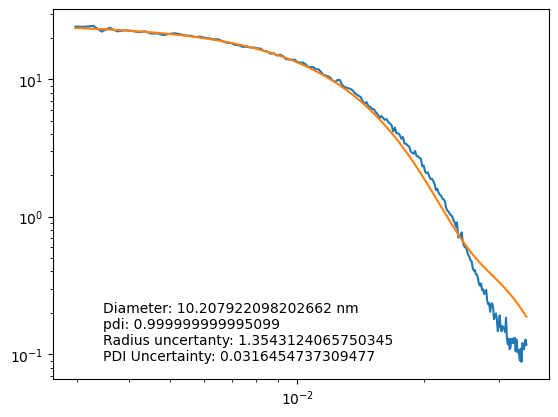

reasonable fit? y


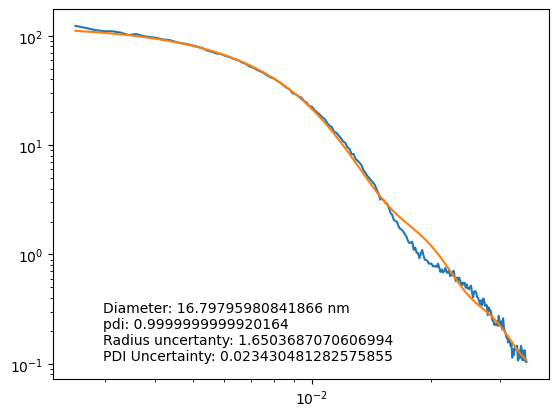

reasonable fit? y


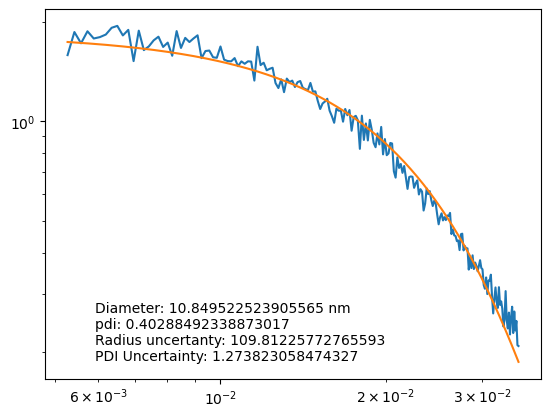

reasonable fit? y


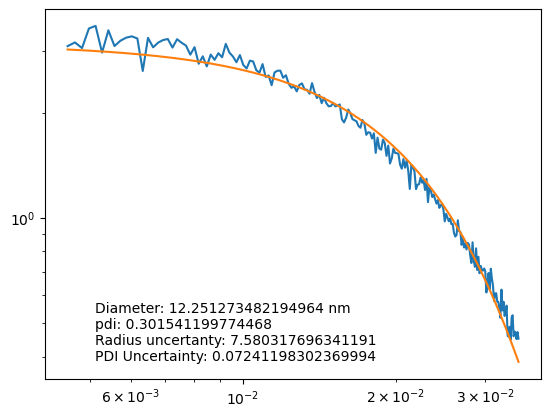

reasonable fit? y


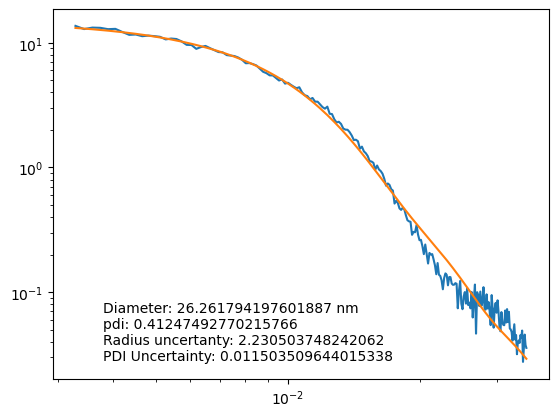

reasonable fit? y


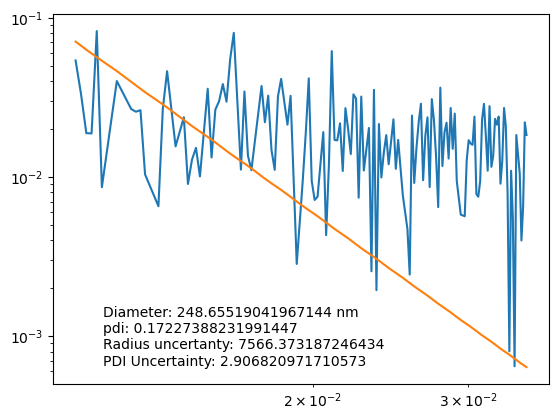

reasonable fit? y


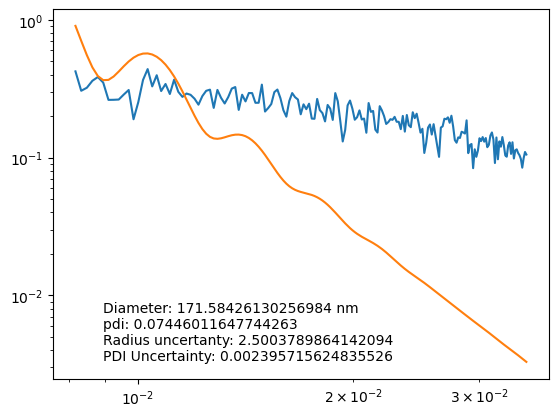

reasonable fit? n


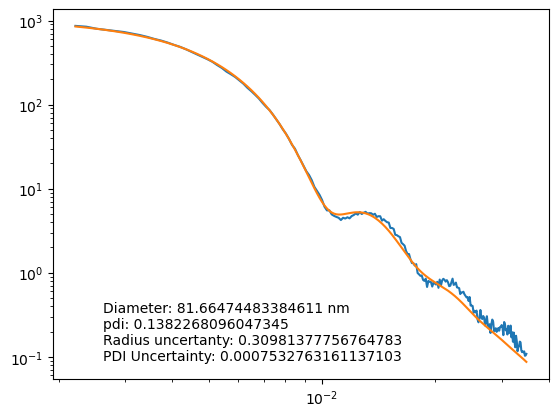

reasonable fit? y


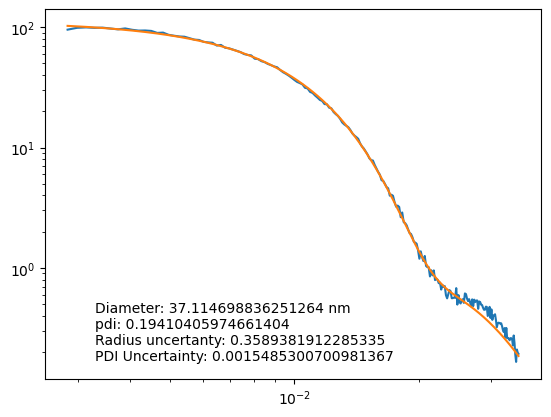

reasonable fit? y


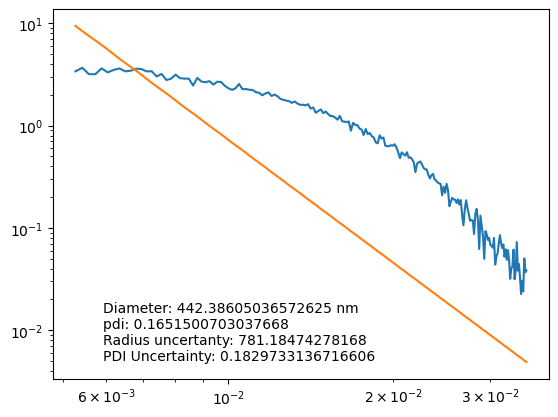

reasonable fit? n


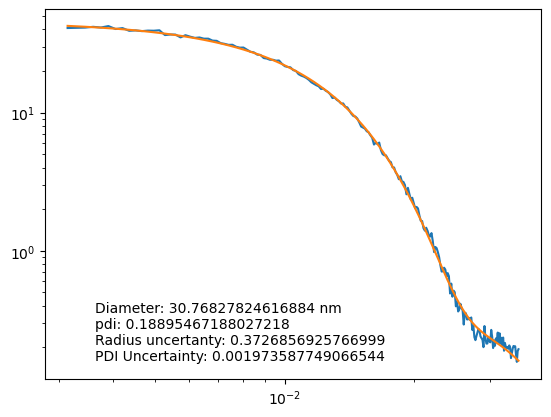

reasonable fit? y


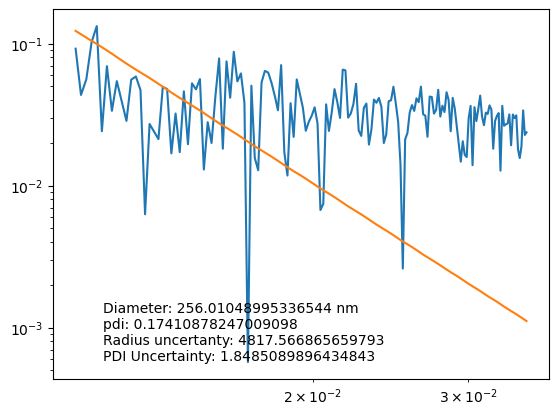

reasonable fit? n


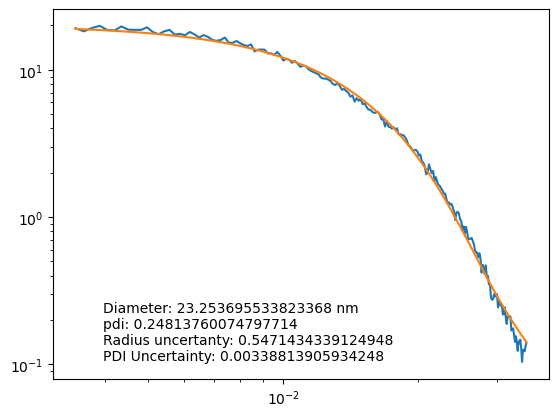

reasonable fit? y


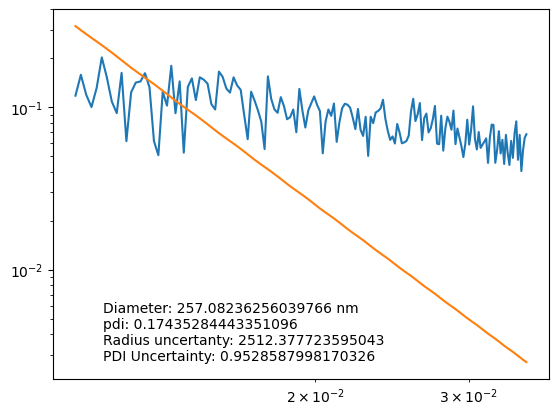

reasonable fit? n


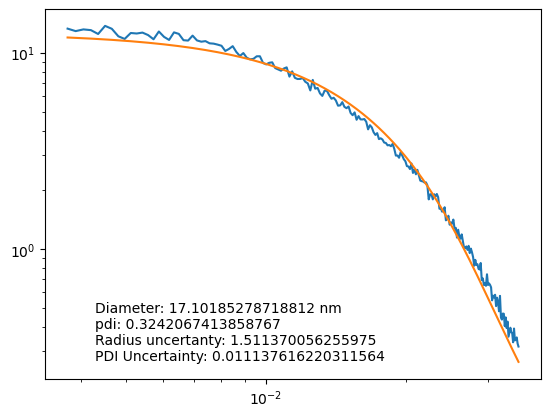

reasonable fit? y


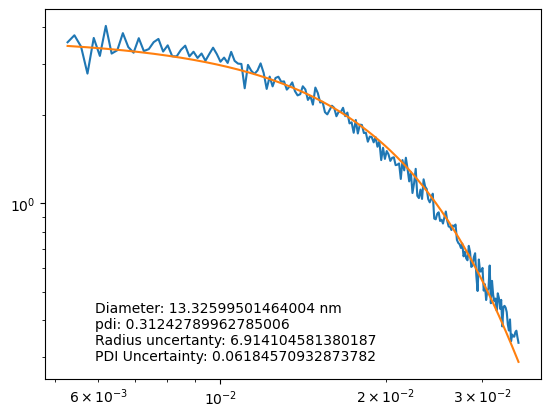

reasonable fit? y


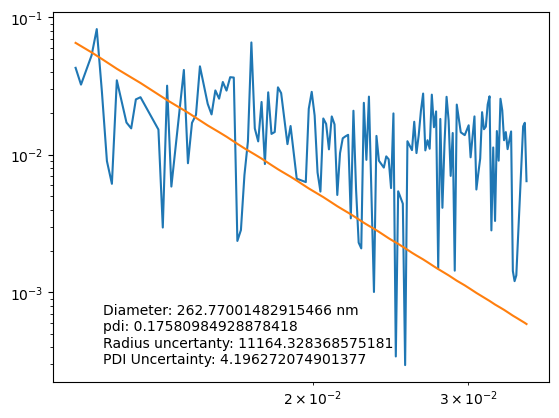

reasonable fit? n


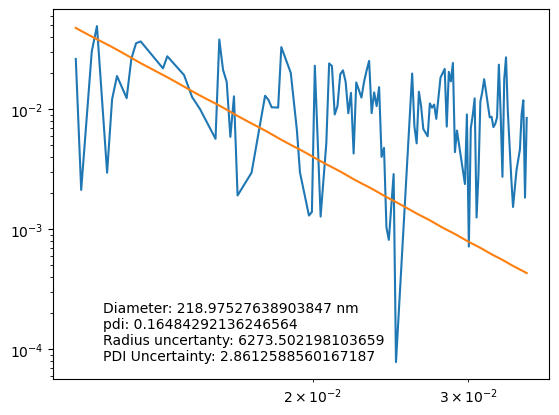

reasonable fit? n


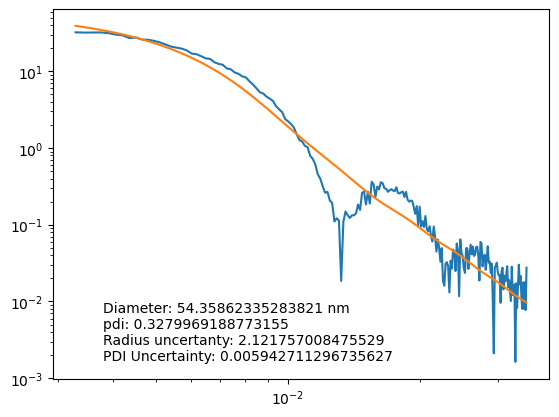

reasonable fit? n


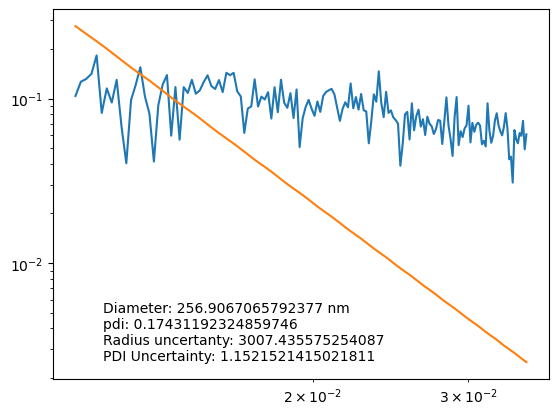

reasonable fit? n


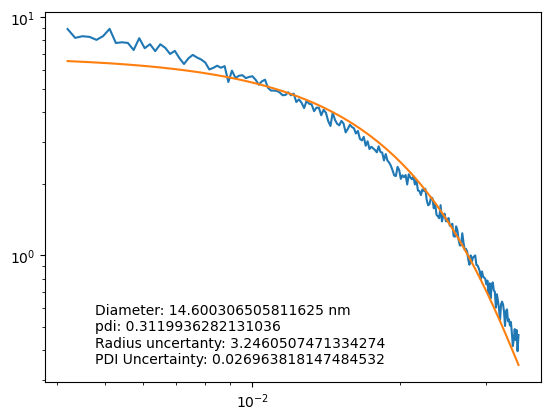

reasonable fit? y


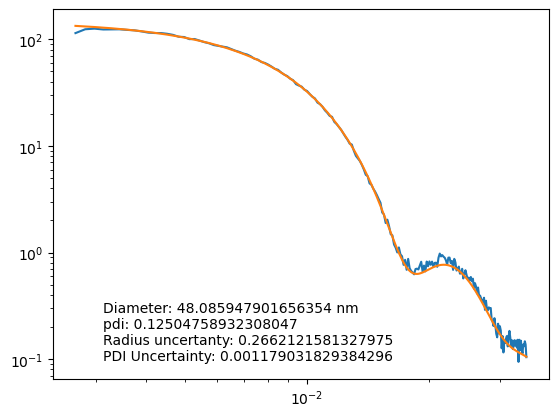

reasonable fit? y


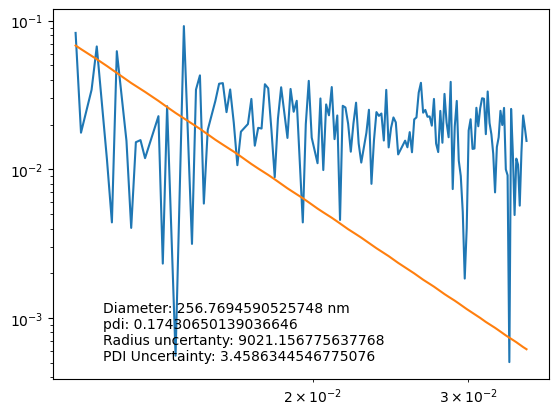

reasonable fit? n


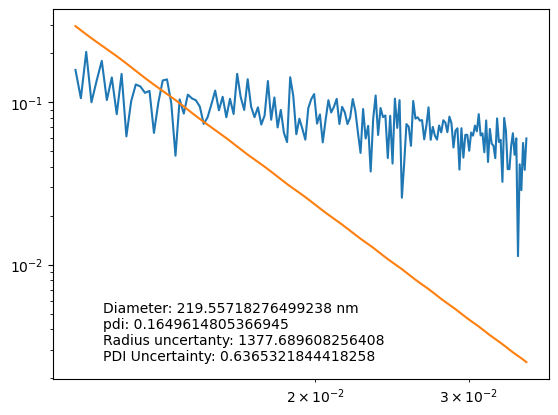

reasonable fit? n


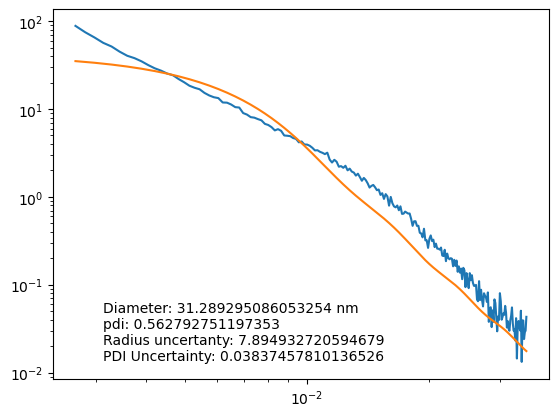

reasonable fit? n


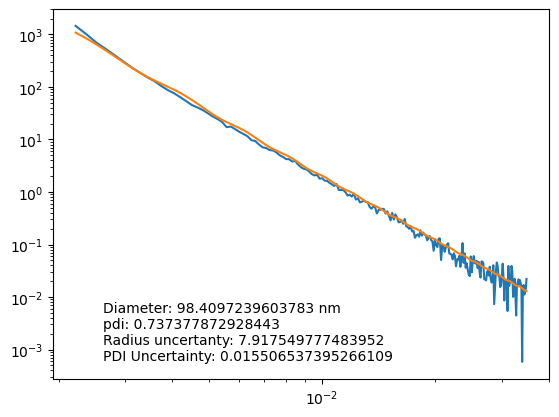

reasonable fit? y


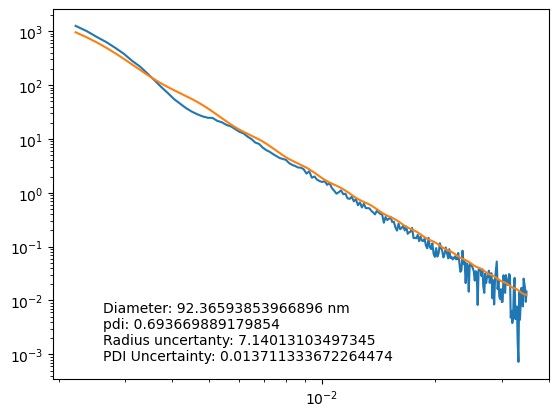

reasonable fit? y


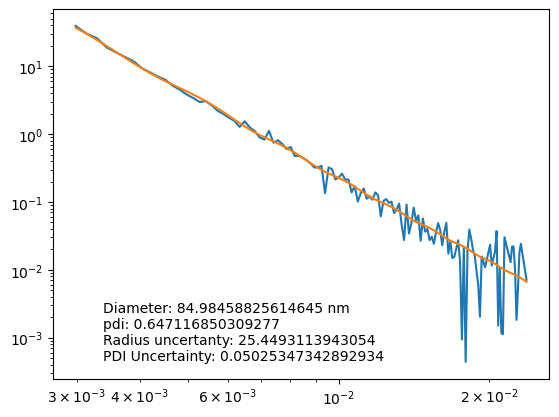

reasonable fit? y


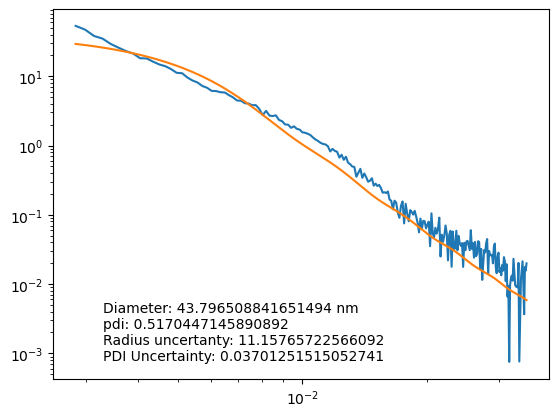

reasonable fit? n


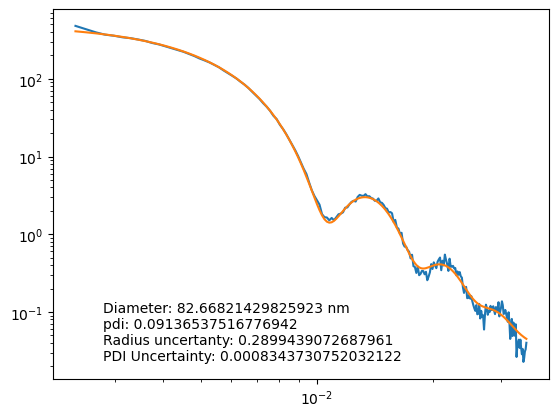

reasonable fit? y


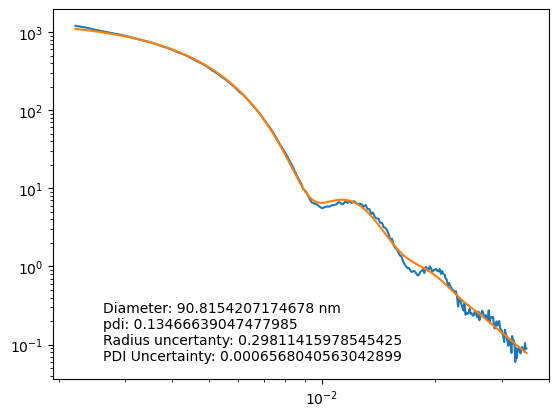

reasonable fit? y


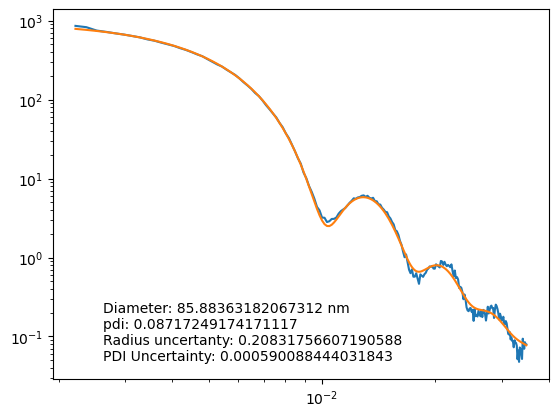

reasonable fit? y


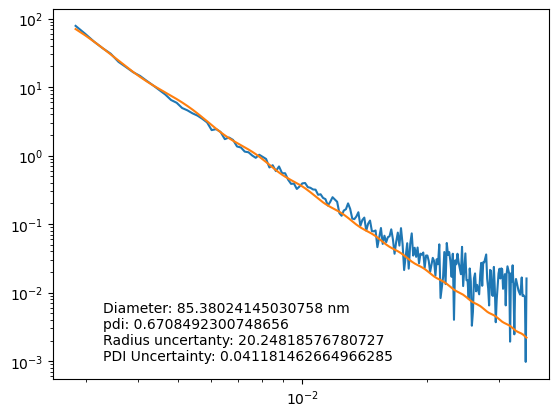

reasonable fit? n


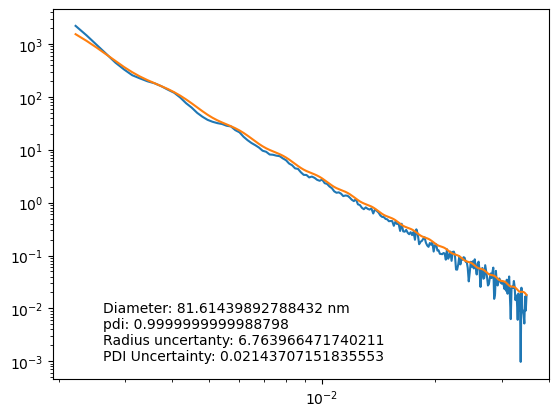

reasonable fit? n


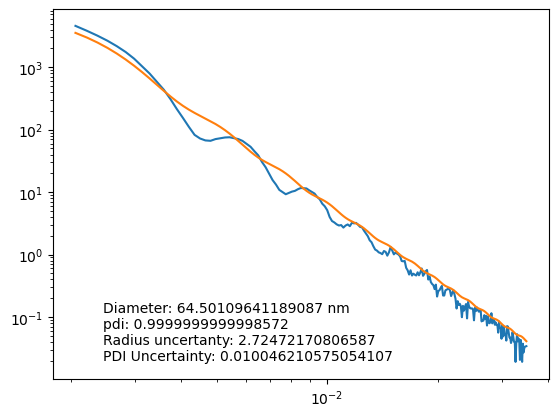

reasonable fit? n


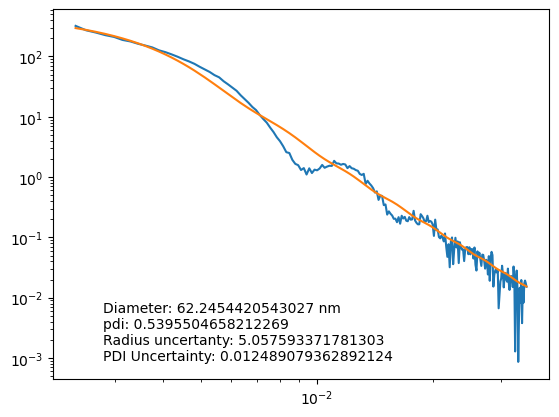

reasonable fit? n


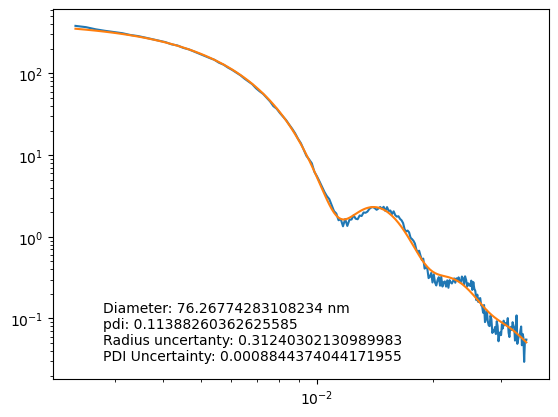

reasonable fit? y


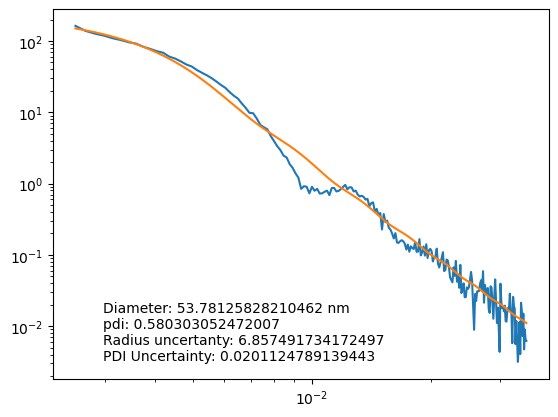

reasonable fit? n


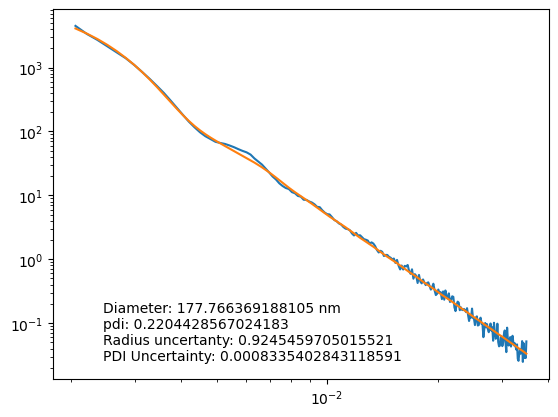

reasonable fit? y


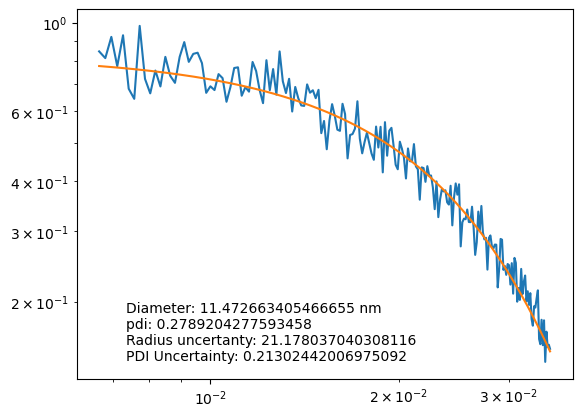

reasonable fit? y


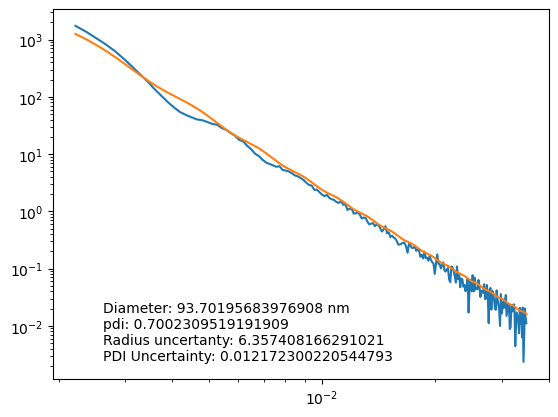

reasonable fit? y


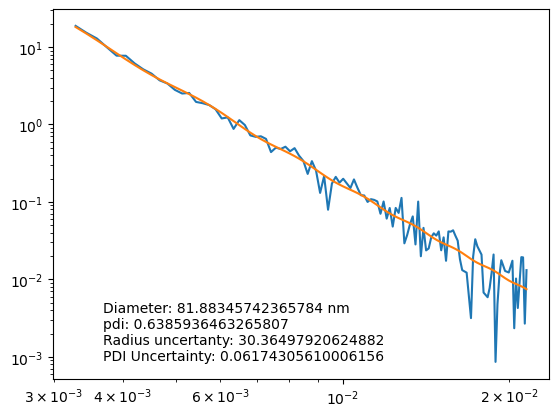

reasonable fit? y


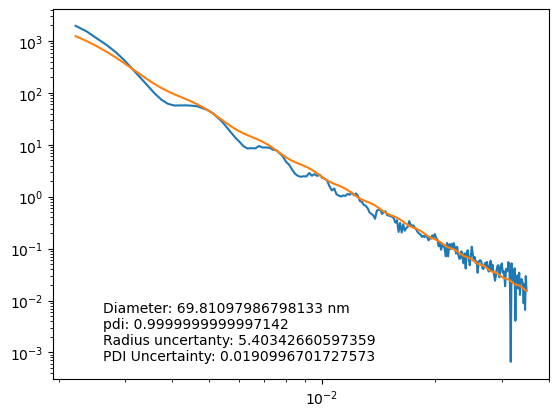

reasonable fit? y


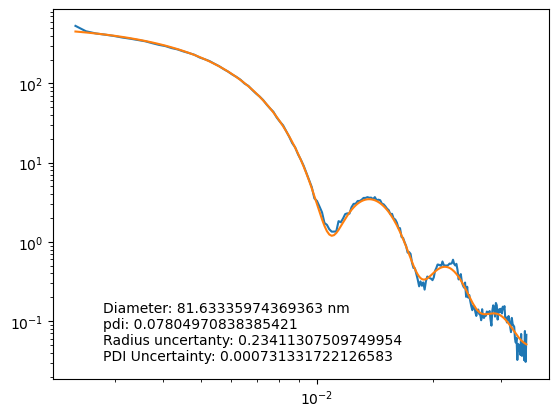

reasonable fit? n


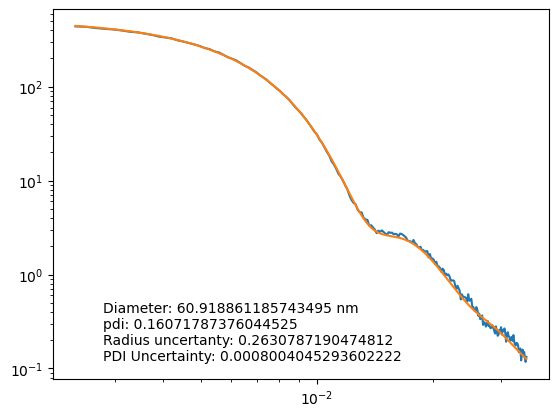

reasonable fit? y


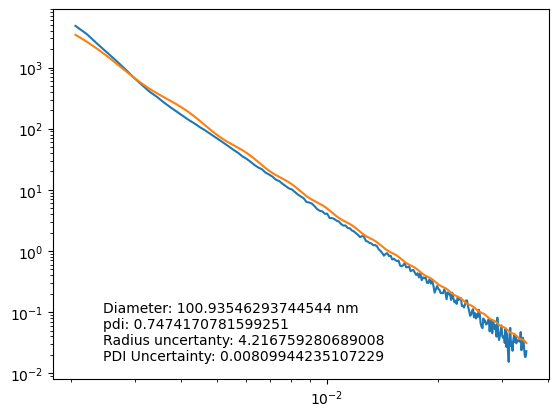

reasonable fit? y


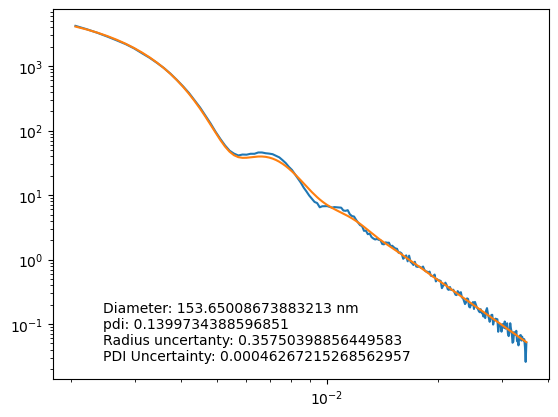

reasonable fit? y


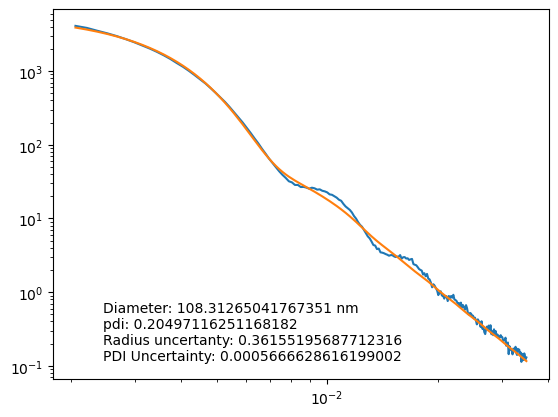

reasonable fit? y


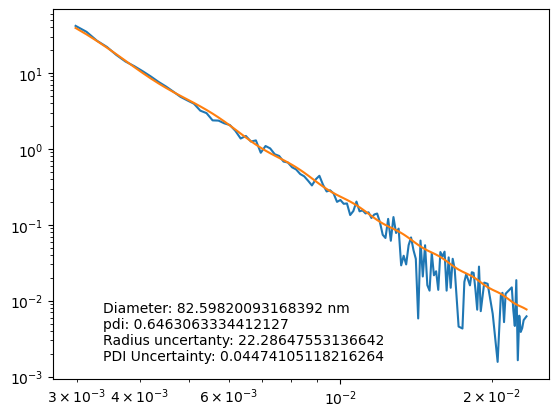

reasonable fit? y


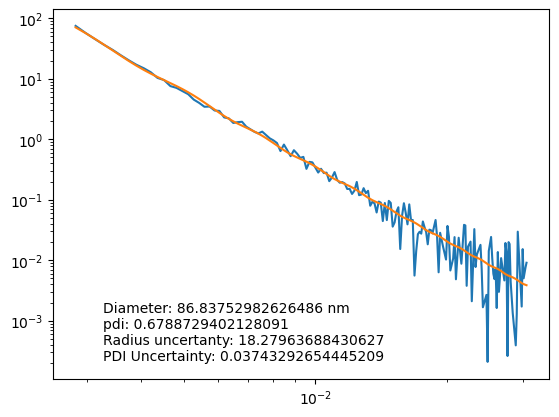

reasonable fit? y


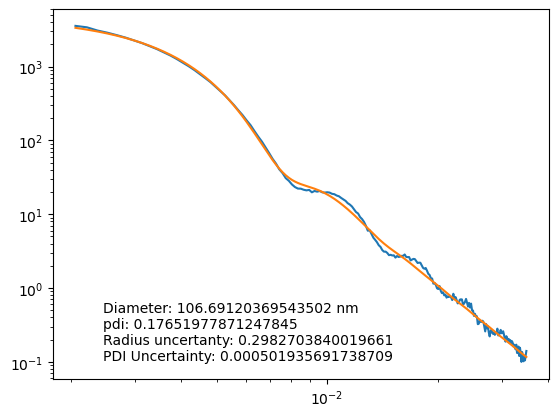

reasonable fit? y


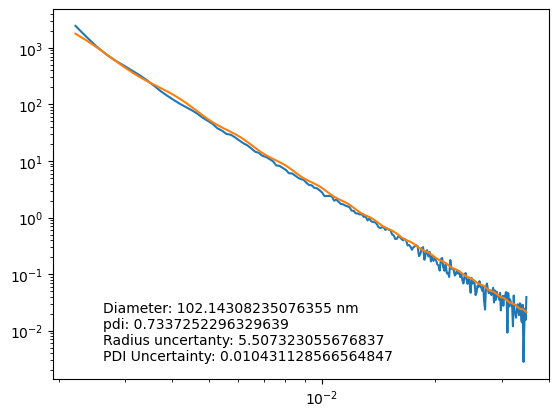

reasonable fit? y


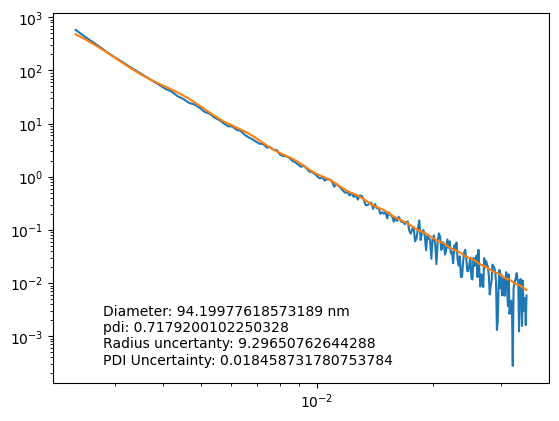

reasonable fit? y


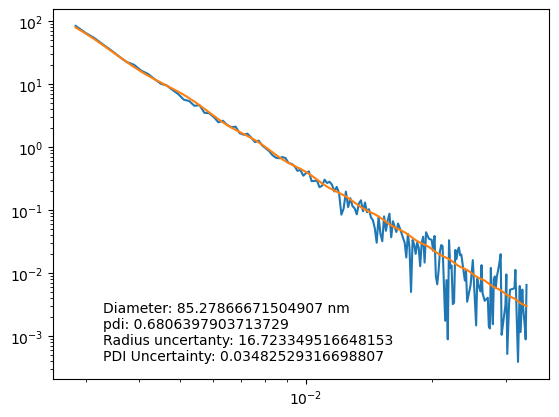

reasonable fit? y


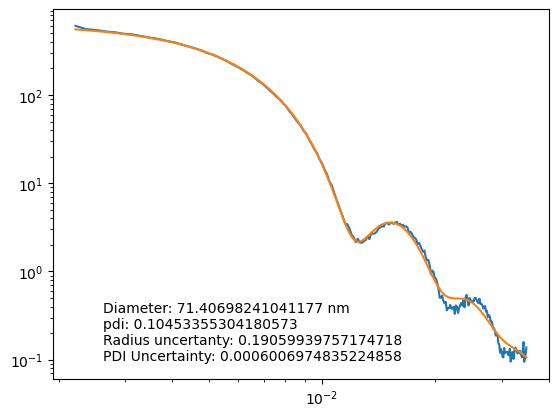

reasonable fit? y


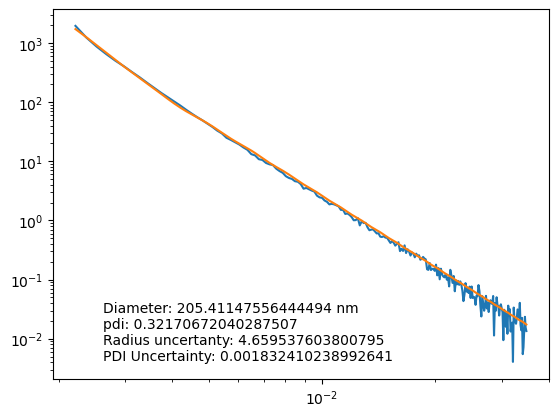

reasonable fit? y


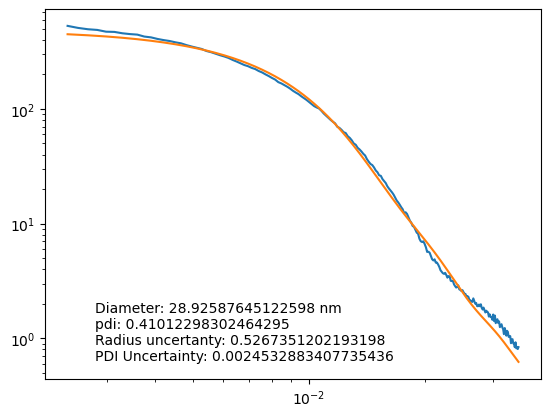

reasonable fit? y


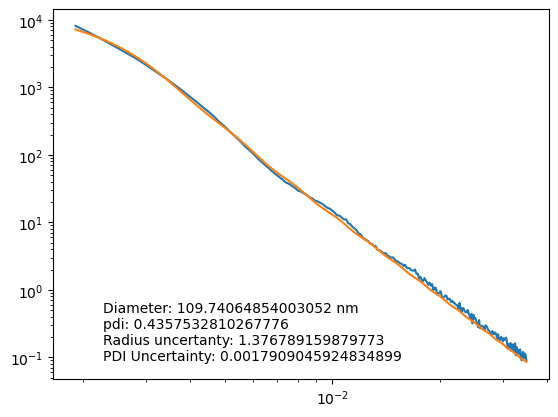

reasonable fit? y


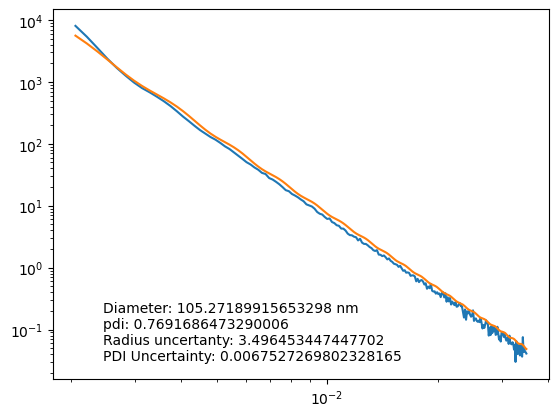

reasonable fit? y


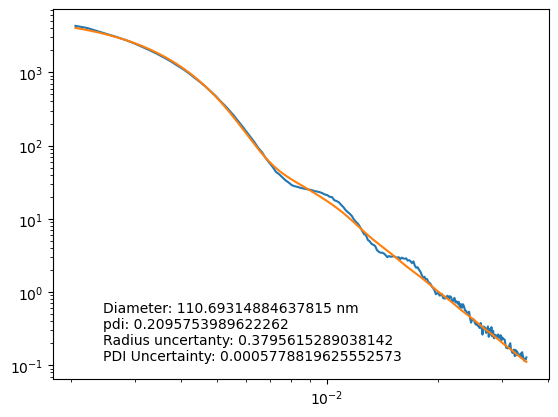

reasonable fit? y


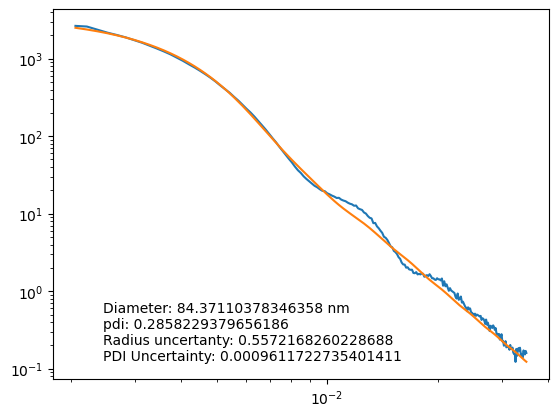

reasonable fit? y


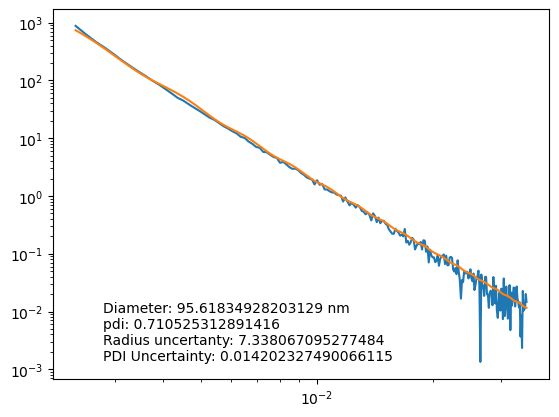

reasonable fit? y


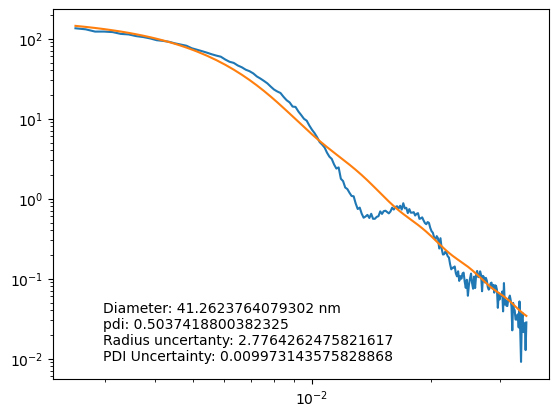

reasonable fit? n


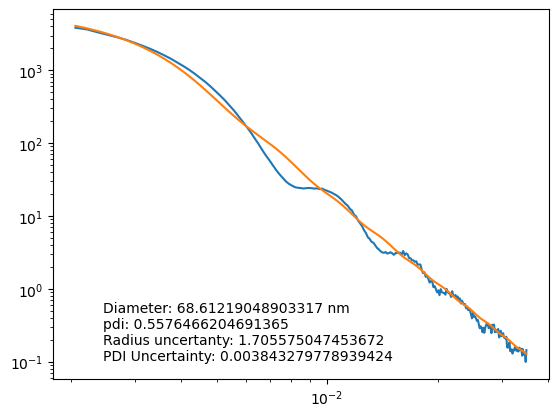

reasonable fit? n


In [32]:
for uuid_val, entry in processing_dataset.items():
    try:
        sphere_d = entry['sphere_fit_results']['radius']*2/10
        sphere_pdi = entry['sphere_fit_results']['radius_pd']
        r_uncertainty = entry['sphere_fit_results']['radius_uncertainty']
        pdi_uncertainty = entry['sphere_fit_results']['radius_pd_uncertainty']
    
        problem = entry['sphere_fit_problem']
    except KeyError:
        continue

    for model in problem.models:
        data = model._data
        Icalc = model.Iq_calc

    fig, ax = plt.subplots()

    ax.loglog(data.x, data.y, label = 'measured')
    ax.loglog(data.x, Icalc, label = 'fit')
    ax.text(0.1, 0.05, f'Diameter: {sphere_d} nm\npdi: {sphere_pdi}\nRadius uncertanty: {r_uncertainty}\nPDI Uncertainty: {pdi_uncertainty}', transform = ax.transAxes)
    plt.show()
    reasonable = input('reasonable fit?')
    if 'y' in reasonable.lower():
        processing_dataset[uuid_val]['good_fit'] = True
    else:
        processing_dataset[uuid_val]['good_fit'] = False

    plt.close()

In [39]:
good_count = 0
for uuid_val, entry in processing_dataset.items():
    try:
        if entry['good_fit']:
            good_count +=1
    except KeyError:
        continue

In [40]:
good_count

138

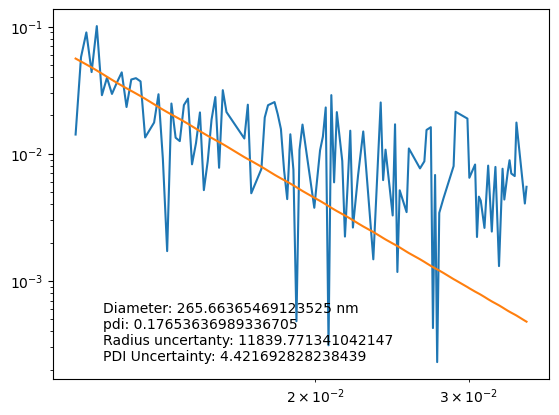

reasonable fit? n


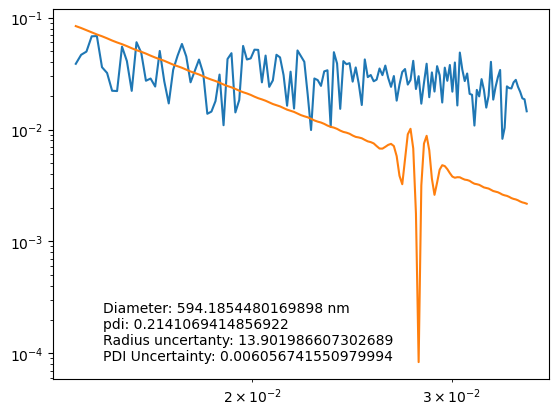

reasonable fit? n


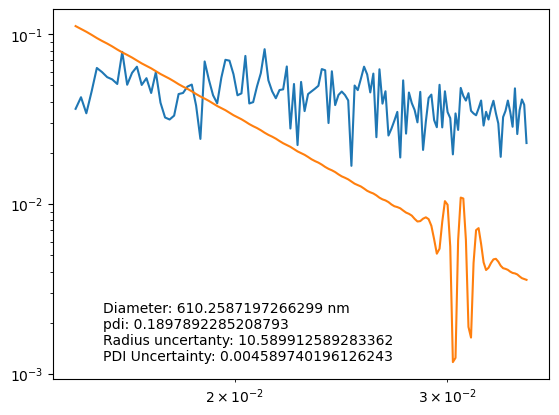

reasonable fit? n


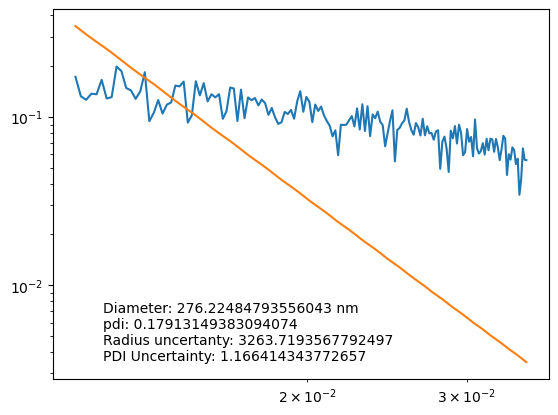

reasonable fit? n


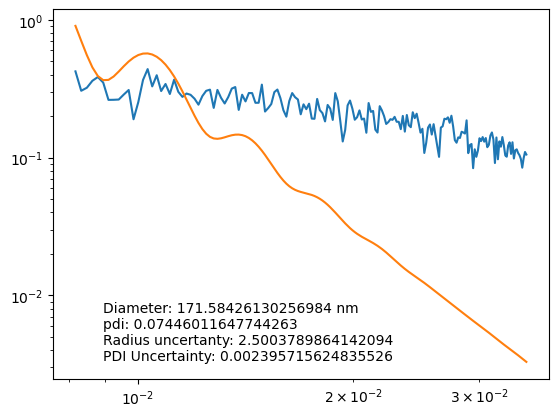

reasonable fit? n


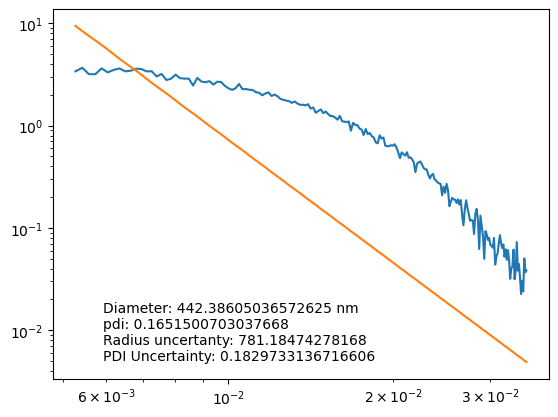

reasonable fit? n


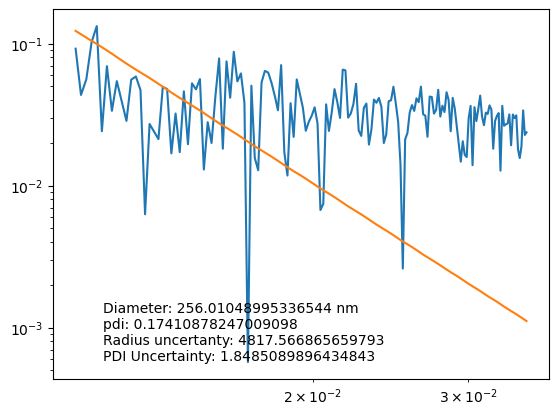

reasonable fit? n


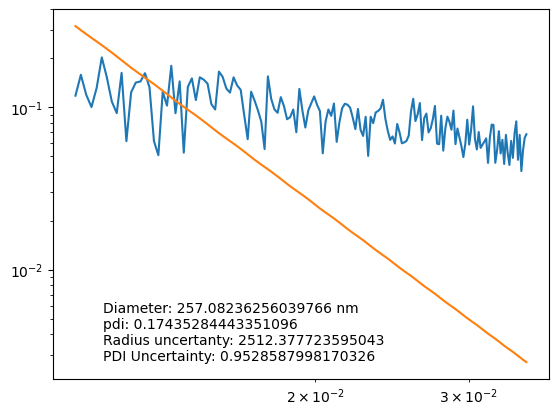

reasonable fit? n


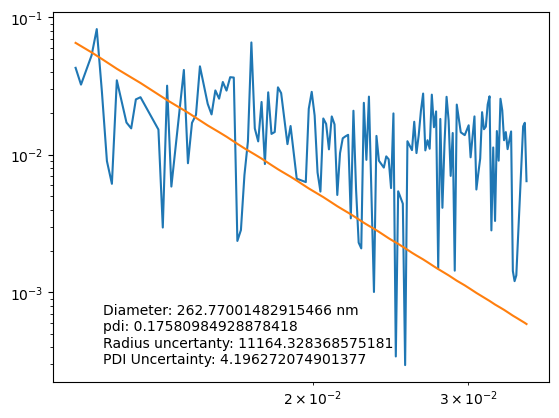

reasonable fit? n


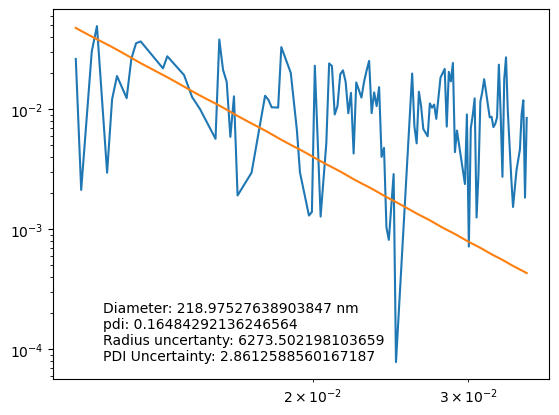

reasonable fit? n


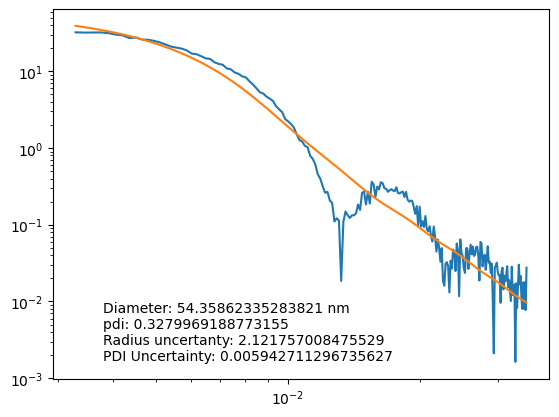

reasonable fit? n


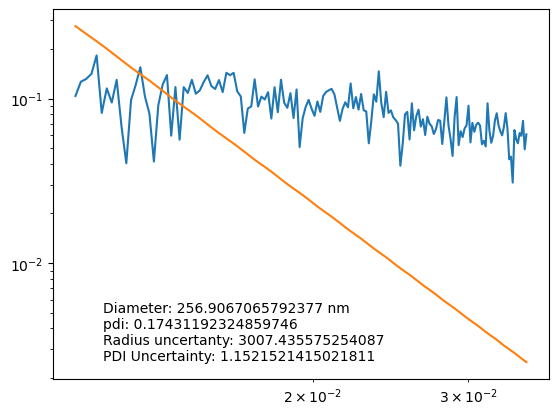

reasonable fit? n


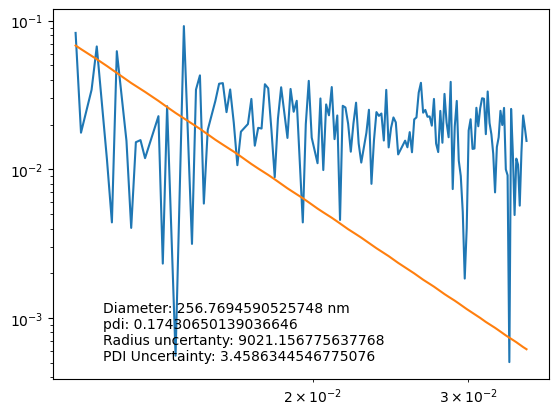

reasonable fit? n


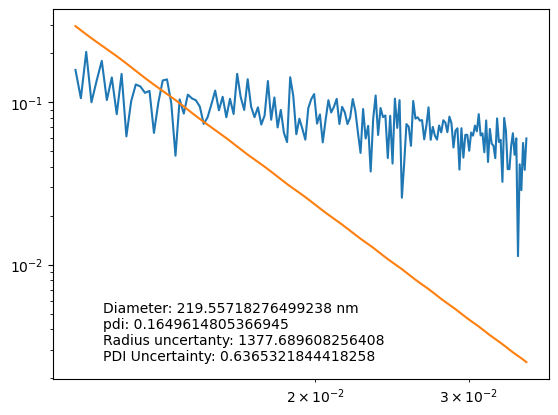

reasonable fit? n


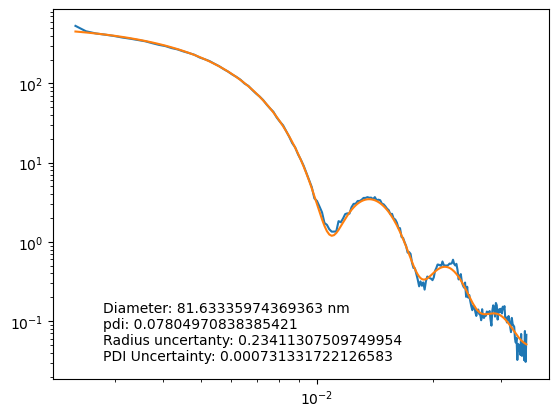

reasonable fit? y


In [38]:
for uuid_val, entry in processing_dataset.items():
    try:
        sphere_d = entry['sphere_fit_results']['radius']*2/10
        sphere_pdi = entry['sphere_fit_results']['radius_pd']
        r_uncertainty = entry['sphere_fit_results']['radius_uncertainty']
        pdi_uncertainty = entry['sphere_fit_results']['radius_pd_uncertainty']
    
        problem = entry['sphere_fit_problem']
    except KeyError:
        continue

    if entry['good_fit'] == False:
        if sphere_pdi < 0.4:

            for model in problem.models:
                data = model._data
                Icalc = model.Iq_calc
        
            fig, ax = plt.subplots()
        
            ax.loglog(data.x, data.y, label = 'measured')
            ax.loglog(data.x, Icalc, label = 'fit')
            ax.text(0.1, 0.05, f'Diameter: {sphere_d} nm\npdi: {sphere_pdi}\nRadius uncertanty: {r_uncertainty}\nPDI Uncertainty: {pdi_uncertainty}', transform = ax.transAxes)
            plt.show()
            reasonable = input('reasonable fit?')
            if 'y' in reasonable.lower():
                processing_dataset[uuid_val]['good_fit'] = True
            else:
                processing_dataset[uuid_val]['good_fit'] = False
        
            plt.close()

    else:
        continue

## write to disk

In [47]:
uuid_vals = []
amplitude = []
phase = []
sum_ap = []
statuses = []
sphere_diameter = []
sphere_pdi = []

for uuid_val, entry in processing_dataset.items():
    try:
        status = entry['status']
        if status == 'failed':
            uuid_vals.append(uuid_val)
            statuses.append('failed')
            sphere_diameter.append(None)
            sphere_pdi.append(None)
            continue
        else:
            raise KeyError
    except KeyError:
        if entry['good_fit'] == False:
            uuid_vals.append(uuid_val)
            statuses.append('failed_fit')
            sphere_diameter.append(None)
            sphere_pdi.append(None)
        else:
            uuid_vals.append(uuid_val)
            statuses.append('successful_fit')
            sphere_diameter.append(entry['sphere_fit_results']['radius']*2/10)
            sphere_pdi.append(entry['sphere_fit_results']['radius_pd'])

In [48]:
fit_results = pd.DataFrame({'uuid':uuid_vals, 'status':statuses, 'sphere_diameter':sphere_diameter, 'sphere_pdi':sphere_pdi})

In [49]:
fit_results

,uuid,status,sphere_diameter,sphere_pdi
0,770a433d-0480-4cee-bf12-ce066c24db55,successful_fit,47.474161,0.591172
1,fed3ab35-04e9-4916-8527-8627191a3bdc,successful_fit,107.459643,0.132383
2,4ab46dcc-3395-4e7b-bb87-52e805e12abb,failed_fit,NaN,NaN
3,23850c30-c572-41ad-abf0-7e1bd4fa7397,failed_fit,NaN,NaN
4,96ef6012-d812-4975-8b77-8ed7e78669fb,successful_fit,67.307375,0.567666
...,...,...,...,...
195,52812388-4002-435e-a8df-fc39c962903f,successful_fit,110.693149,0.209575
196,f9c5e673-ef4c-4e1e-832d-307ab7bd2d99,successful_fit,84.371104,0.285823
197,bdbbf131-7db4-4768-846e-2de75e623ef2,successful_fit,95.618349,0.710525
198,f0f8a098-6c89-409b-8fe3-ffd4b4f106a8,failed_fit,NaN,NaN


In [50]:
fit_results.to_csv('sphere_fit_results_11_21_24.csv')